In [1]:
import os

def change_dir_in_hipergator():
    # this env var is set on hipergator (SLURM is the job scheduler there)
    if os.getenv("SLURM_JOB_ID", None):
        target_dir = "diff_fam_social_memory_ephys"
        current = os.getcwd()

        while True:
            parent = os.path.dirname(current)
            # If we've reached the root directory without finding the target
            if parent == current:
                raise FileNotFoundError(f"Could not find parent directory '{target_dir}'")

            # Check if the target directory is the current parent's name
            if os.path.basename(parent) == target_dir:
                os.chdir(parent)
                return parent

            current = parent

# Usage
try:
    new_path = change_dir_in_hipergator()
    print(f"Successfully changed to directory: {new_path}")
except FileNotFoundError as e:
    print(e)

Successfully changed to directory: /blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys


In [2]:
import pandas as pd
import numpy as np
import lfp.lfp_analysis.LFP_collection as LFP_collection
import lfp.lfp_analysis.LFP_analysis as lfpa
import pickle
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import cm
from matplotlib.ticker import ScalarFormatter
import lfp.lfp_analysis.LFP_analysis as lfpa
from itertools import combinations, permutations
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from importlib import reload
from lfp.lfp_analysis.LFP_collection import LFPCollection
def pickle_this(thing_to_pickle, file_name):
    """
    Pickles things
    Args (2):
        thing_to_pickle: anything you want to pickle
        file_name: str, filename that ends with .pkl
    Returns:
        none
    """
    with open(file_name, "wb") as file:
        pickle.dump(thing_to_pickle, file)


def unpickle_this(pickle_file):
    """
    Unpickles things
    Args (1):
        file_name: str, pickle filename that already exists and ends with .pkl
    Returns:
        pickled item
    """
    with open(pickle_file, "rb") as file:
        return pickle.load(file)
    


cups_lfp_json = "data/cups_lfp_sd5/lfp_collection.json"

cups_collection = LFP_collection.LFPCollection.load_collection(cups_lfp_json)



behavior_dicts = unpickle_this('pilot2/cups_phase4/cups_behavior_dicts.pkl')

for recording in cups_collection.lfp_recordings:
    subject = str(int(recording.name.split('_')[0])/10)
    recording_pattern = (recording.name.split('_')[0] + '_' +
                         recording.name.split('_')[1] + '_' +
                         recording.name.split('_')[2] + '_' +
                         'aggregated')
    recording.behavior_dict = behavior_dicts[subject]
    recording.subject = subject
    recording.subject = subject
test_rec = cups_collection.lfp_recordings[0]
cups_collection.brain_region_dict = test_rec.brain_region_dict


/blue/npadillacoreano/mcum/conda/envs/lfp_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
cups_lfp2_json = "data/cups_lfp_r2_sd5/lfp_collection.json"

cups2_collection = LFP_collection.LFPCollection.load_collection(cups_lfp2_json)
behavior_dict2 = unpickle_this(r"pilot2/cups_phase4/cups_r2_behavior_dicts.pkl")


In [4]:
behavior_dict2['2.2'].keys()

dict_keys(['cup 1', 'cup 2', 'cup 3', 'cup 4', 'acquisition', 'empty acquisition', 'familiar', 'novel', 'cagemate', 'empty', 'cagemate_baseline', 'familiar_baseline', 'novel_baseline', 'empty_baseline', 'pink', 'orange', 'blue', 'green'])

In [5]:
for recording in cups2_collection.lfp_recordings:
    print(recording.name)
    subject = int(recording.name.split("_")[0])/10
    print(subject)
    recording.behavior_dict = behavior_dict2[str(subject)]
    recording.subject = subject

41_cups_p8_merged.rec
4.1
31_cups_p8_merged.rec
3.1
23_cups_p8_merged.rec
2.3
44_cups_p8_merged.rec
4.4
22_cups_p8_merged.rec
2.2
32_cups_p8_merged.rec
3.2


In [6]:
import math
from scipy import stats
def __get_events__(recording, event, power, event_len, pre_window, post_window, average = True):
    """
    takes snippets of power, coherence, or causality for events
    optional pre-event and post-event windows (s) may be included
    all events can also be of equal length by extending
    snippet lengths to the longest event

    Args (6 total, 4 required):
        recording: LFP object instance, recording to get snippets
        event: str, event type of which ehpys snippets happen during
        whole_recording: numpy array, power, coherence, or granger causality
            for the whole recording
        event_len: optional, float, length (s) of events used by padding with
            post event time or trimming events all to event_len (s) long, if not
            defined, full event is used
        pre_window: int, default=0, seconds prior to start of event
        post_window: int, default=0, seconds after end of event

    Returns (1):
        event_averages: list, event specific measures of
            power, coherence, or casualities measures during an event including
            pre_window & post_windows, accounting for event_len and
            timebins; if mode is power, event_snippets has
            dimensions of [e, t, f, b] where e = no of events, b = no. of
            brain regions, t = no. of timebins, f = no. of frequencies
            if mode is causality or coherence then event snippets has the
            shape [e, t, f, b, b]
    """
    try:
        events = recording.behavior_dict[event]
    except KeyError:
        print(f"{event} not in event dictionary. Please check spelling")
    all_events = []
    pre_window = math.ceil(pre_window * 1000)
    post_window = math.ceil(post_window * 1000)
    freq_timebin = recording.timestep * 1000
    if event_len is not None:
        event_len_ms = event_len * 1000
    whole_recording = power
    for i in range(events.shape[0]):
        if event_len is not None:
            pre_event = math.ceil((events[i][0] - pre_window) / freq_timebin)
            post_event = math.ceil((events[i][0] + post_window + event_len_ms) / freq_timebin)
        if event_len is None:
            pre_event = math.ceil((events[i][0] - pre_window) / freq_timebin)
            post_event = math.ceil((events[i][1] + post_window) / freq_timebin)
        if post_event < whole_recording.shape[0]:
            # whole_recording = [t, f, b]  for power
            # whole_recording = [t,f,b,b] for coherence + granger
            event_snippet = whole_recording[pre_event:post_event, ...]
            if average:
                event_snippet = np.nanmean(event_snippet, axis=0)
            all_events.append(event_snippet)
    return all_events



def average_events(
    lfp_collection, events, mode, baseline=None, event_len=None, pre_window=0, post_window=0, plot=False, regions = None, freq_range = None
):
    """
    Calculates average event measurement (power, coherence, or granger) per recording then
    calculates global averages across all recordings from recording averages (to account for
    differences in event numbers per recording)
    """
    event_averages_dict = {}
    recordings = [lfp_collection]
    for i in range(len(events)):
        recording_averages = []
        for recording in recordings:
            event_averages = __get_events__(recording, events[i], mode, event_len, pre_window, post_window, average = True)
            if baseline is not None:
                adj_averages = __baseline_diff__(
                    recording, event_averages, baseline[i], mode, event_len, pre_window=0, post_window=0, average = True
                )
                recording_averages = recording_averages + adj_averages
            else:
                recording_averages = recording_averages + event_averages
        # recording_averages = [trials, b, f] or [trials, b, b, f]
        event_averages_dict[events[i]] = recording_averages
    if plot:
        plot_power_averages(lfp_collection, event_averages_dict,  regions, freq_range)
    return event_averages_dict

def plot_power_averages(lfp_collection, event_averages, regions=None, freq_range=None):
    if regions is None:
        regions = list(lfp_collection.brain_region_dict.keys())
    if freq_range is None:
        freq_range = [1, 101]
    
    # Calculate rows and columns for subplots
    n_regions = len(regions)
    n_cols = min(3, n_regions)  # Max 3 columns
    n_rows = (n_regions + n_cols - 1) // n_cols  # Ceiling division
    
    # Create figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    
    # Flatten axes array for easier indexing if there are multiple subplots
    if n_regions > 1:
        if n_rows == 1 and n_cols == 1:
            axes = np.array([axes])
        axes = axes.flatten()
    else:
        axes = [axes]
    
    # Hide any unused subplots
    for i in range(n_regions, len(axes)):
        axes[i].set_visible(False)
    
    # Plot each region in its own subplot
    for i, region in enumerate(regions):
        ax = axes[i]
        y_max = 0  # Keep track of maximum y value for consistent scaling
        
        for event, averages in event_averages.items():
            # Get the regional data
            region_index = lfp_collection.brain_region_dict[region]
            
            # Calculate mean and SEM across trials
            event_average = np.nanmean(averages, axis=0)
            event_sem = stats.sem(averages, axis=0, nan_policy="omit")
            
            # Extract data for the selected frequency range and region
            y = event_average[freq_range[0]:freq_range[1], region_index]
            y_sem = event_sem[freq_range[0]:freq_range[1], region_index]
            x = range(freq_range[0], freq_range[1])
            
            # Track maximum value for y-axis scaling
            y_max = max(y_max, np.nanmax(y + y_sem))
            
            # Plot mean and SEM
            (line,) = ax.plot(x, y, label=event)
            ax.fill_between(x, y - y_sem, y + y_sem, alpha=0.2, color=line.get_color())
        
        # Set titles and labels
        ax.set_title(f"{region}", fontsize = 20)
        ax.set_xlabel("Frequency (Hz)")
        ax.set_ylabel("Power")
        
        # Add legend to each subplot
        ax.legend()
    
    # Adjust layout for better spacing
    plt.tight_layout()
    plt.suptitle("Regional Power Averages", fontsize=16)
    plt.subplots_adjust(top=0.93)  
    
def power_averages(
    lfp_collection, events, modes, titles=None, baseline=None, event_len=None, pre_window=0, post_window=0, plot=False, regions=None, freq_range=None
):
    """
    Calculates average event measurement (power, coherence, or granger) per recording then
    calculates global averages across all recordings from recording averages (to account for
    differences in event numbers per recording)
    
    Parameters:
    -----------
    lfp_collection : object
        Collection of LFP recordings
    events : list
        List of event names to analyze
    modes : list
        List of power calculation results (can be power, coherence, or granger)
    titles : list, optional
        List of titles for each mode (should be same length as modes)
    baseline : list, optional
        List of baseline events
    event_len : float, optional
        Length of event in seconds
    pre_window : float, optional
        Time before event in seconds
    post_window : float, optional
        Time after event in seconds
    plot : bool, optional
        Whether to plot the results
    regions : list, optional
        List of brain regions to include
    freq_range : list, optional
        Frequency range to plot [min, max]
    
    Returns:
    --------
    dict
        Dictionary of event averages for each event and mode
    """
    if not isinstance(modes, list):
        modes = [modes]
    
    if titles is None:
        titles = [f"Mode {i+1}" for i in range(len(modes))]
    elif not isinstance(titles, list):
        titles = [titles]
    
    if len(titles) != len(modes):
        raise ValueError("Length of titles must match length of modes")
    
    # Dictionary to store results for all modes
    all_event_averages = {}
    
    for mode_idx, mode in enumerate(modes):
        event_averages_dict = {}
        recordings = [lfp_collection]
        
        for i in range(len(events)):
            recording_averages = []
            for recording in recordings:
                event_averages = __get_events__(recording, events[i], mode, event_len, pre_window, post_window, average=True)
                if baseline is not None:
                    adj_averages = __baseline_diff__(
                        recording, event_averages, baseline[i], mode, event_len, pre_window=0, post_window=0, average=True
                    )
                    recording_averages = recording_averages + adj_averages
                else:
                    recording_averages = recording_averages + event_averages
            # recording_averages = [trials, b, f] or [trials, b, b, f]
            event_averages_dict[events[i]] = recording_averages
        
        # Store in the all_event_averages dictionary using the title as the key
        all_event_averages[titles[mode_idx]] = event_averages_dict
    
    if plot:
        plot_power_comparison(lfp_collection, all_event_averages, regions, freq_range)
    
    return all_event_averages

def plot_power_comparison(lfp_collection, all_event_averages, regions=None, freq_range=None):
    """
    Plots comparison of different power calculation methods for each brain region.
    
    Parameters:
    -----------
    lfp_collection : object
        Collection of LFP recordings
    all_event_averages : dict
        Dictionary of dictionaries with event averages for each mode
    regions : list, optional
        List of brain regions to plot
    freq_range : list, optional
        Frequency range to plot [min, max]
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy import stats
    
    if regions is None:
        regions = list(lfp_collection.brain_region_dict.keys())
    if freq_range is None:
        freq_range = [1, 101]
    
    # Get number of power calculation methods (modes)
    n_modes = len(all_event_averages)
    
    # Get the events (assuming all modes have the same events)
    first_mode_key = list(all_event_averages.keys())[0]
    events = list(all_event_averages[first_mode_key].keys())
    
    # Create figure with subplots - One row per region, one column per mode
    fig, axes = plt.subplots(len(regions), n_modes, figsize=(12, 8))
    
    # For each brain region (rows)
    for region_idx, region in enumerate(regions):
        region_index = lfp_collection.brain_region_dict[region]
        
        # Find global max y-value for consistent scaling across all plots in this row
        y_max = 0
        for mode_title, event_averages_dict in all_event_averages.items():
            for event, averages in event_averages_dict.items():
                event_average = np.nanmean(averages, axis=0)
                event_sem = stats.sem(averages, axis=0, nan_policy="omit")
                try:
                    y = event_average[freq_range[0]:freq_range[1], region_index]
                    y_sem = event_sem[freq_range[0]:freq_range[1], region_index]
                    y_max = max(y_max, np.nanmax(y + y_sem))
                except IndexError:
                    pass
        # For each power calculation method (columns)
        for mode_idx, (mode_title, event_averages_dict) in enumerate(all_event_averages.items()):
            ax = axes[region_idx, mode_idx]
            
            # Plot each event for this mode and region
            for event, averages in event_averages_dict.items():
                # Calculate mean and SEM across trials
                event_average = np.nanmean(averages, axis=0)
                event_sem = stats.sem(averages, axis=0, nan_policy="omit")
                try:
                # Extract data for the selected frequency range and region
                    y = event_average[freq_range[0]:freq_range[1], region_index]
                    y_sem = event_sem[freq_range[0]:freq_range[1], region_index]
                    x = range(freq_range[0], freq_range[1])

                    # Plot mean and SEM
                    (line,) = ax.plot(x, y, label=event)
                    ax.fill_between(x, y - y_sem, y + y_sem, alpha=0.2, color=line.get_color())
                except IndexError:
                    print(f'No events of type {event}') 
            # Set titles and labels
            if region_idx == 0:
                ax.set_title(mode_title)
            if mode_idx == 0:
                ax.set_ylabel(f"{region}\nPower")
            if region_idx == len(regions) - 1:
                ax.set_xlabel("Frequency (Hz)")
            if mode_idx == n_modes - 1: 
                ax.legend(bbox_to_anchor= (1,1))
            
            # Set y-axis limit to be consistent for this region
            ax.set_ylim(0, y_max * 1.1)
            
            # Add legend to each subplot
           
    
    # Adjust layout for better spacing
    plt.tight_layout()
    plt.suptitle("Power Comparison Across Calculation Methods by Brain Region", fontsize=16)
    plt.subplots_adjust(top=0.93)
    plt.show()

In [37]:
import lfp.lfp_analysis.preprocessor as preprocessor
import lfp.lfp_analysis.connectivity_wrapper as connect
from scipy.interpolate import interp1d
from importlib import reload
reload(preprocessor)
MEDIAN_ZSCORE_MULTIPLIER = 0.6745
def process_data_with_threshold(rec, threshold, time_window):
    """
    Process recording data with the given threshold and time window.
    Returns processed data for further analysis or plotting.
    """
    scaled_traces = preprocessor.scale_voltage(rec.traces, voltage_scaling_value=rec.voltage_scaling)
    time_window_hz = time_window*1000
    total_time = scaled_traces.shape[0]
    n_regions = scaled_traces.shape[1]
    n_chunks = total_time // time_window_hz
    usable_length = n_chunks * time_window_hz
    trimmed_traces = scaled_traces[:usable_length]
    reshaped_traces = trimmed_traces.reshape(n_chunks, time_window_hz, n_regions)
    
    # Process data
    zscore_traces = zscore_chunks(reshaped_traces)
    thresholded_traces = preprocessor.filter(zscore_traces, reshaped_traces, threshold)
    interpolated_traces = zscore_filter(zscore_traces, reshaped_traces, threshold)
    
    # Flatten for analysis and plotting
    flattened_thresholded = thresholded_traces.reshape(usable_length, n_regions)
    flattened_interpolated = interpolated_traces.reshape(usable_length, n_regions)
    flattened_interpolated = fill_missing(flattened_interpolated)
    flattened_zscores = zscore_traces.reshape(usable_length, n_regions)
    
    # Calculate RMS
    rms_traces = preprocessor.root_mean_square(flattened_thresholded)
    interpolated_rms = preprocessor.root_mean_square(flattened_interpolated)
    
    # Return all processed data
    return {
        'original_traces': scaled_traces[:usable_length],
        'zscore_traces': flattened_zscores,
        'thresholded_traces': flattened_thresholded,
        'interpolated_traces': flattened_interpolated,
        'rms_traces': rms_traces,
        'interpolated_rms': interpolated_rms,
        'usable_length': usable_length
    }

def plot_threshold_analysis(processed_data):
    """
    Plot the analysis results from process_data_with_threshold.
    """
    # Plot thresholded data
    plot_zscore(
        processed_data['original_traces'], 
        processed_data['zscore_traces'], 
        processed_data['thresholded_traces'],
        processed_data['interpolated_traces']
        
    )

    return (processed_data['original_traces'], processed_data['interpolated_rms'])

def plot_to_find_threshold(rec, threshold, time_window):
    """
    Original function preserved for compatibility, now uses the separated functions.
    """
    processed_data = process_data_with_threshold(rec, threshold, time_window)
    return plot_threshold_analysis(processed_data)

def find_and_plot_nan_snippets(processed_data, region_idx=0, window_size=1000, max_snippets=3):
    """
    Find snippets of data with NaNs and plot the original, thresholded, and interpolated traces.
    
    Parameters:
    processed_data : dict
        Output from process_data_with_threshold
    region_idx : int
        Index of the region to analyze
    window_size : int
        Size of the snippet window in samples
    max_snippets : int
        Maximum number of snippets to find and plot
    """
    # Get data for the specified region
    original = processed_data['original_traces'][:, region_idx]
    thresholded = processed_data['thresholded_traces'][:, region_idx]
    interpolated = processed_data['interpolated_traces'][:, region_idx]
    
    # Find indices with NaNs
    nan_indices = np.where(np.isnan(thresholded))[0]
    
    if len(nan_indices) == 0:
        print(f"No NaNs found in region {region_idx}")
        return
    
    # Find start positions for snippets
    snippet_starts = []
    current_start = nan_indices[0] - window_size//4  # Start before NaNs
    
    # Ensure start is within bounds
    current_start = max(0, current_start)
    snippet_starts.append(current_start)
    
    # Find additional snippets if needed
    for idx in nan_indices:
        # Check if we're already far enough from the last snippet start
        if all(abs(idx - start) > window_size for start in snippet_starts):
            new_start = max(0, idx - window_size//4)
            snippet_starts.append(new_start)
            
        # Stop when we have enough snippets
        if len(snippet_starts) >= max_snippets:
            break
    
    # Plot each snippet
    for i, start in enumerate(snippet_starts):
        end = min(start + window_size, len(original))
        
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(6, 4))
        
        # Time axis in milliseconds
        time_axis = np.arange(start, end)
        
        # Original trace
        ax1.plot(time_axis, original[start:end], 'b-')
        ax1.set_title(f"Snippet {i+1}: Original Signal (Region {region_idx})")
        ax1.set_ylabel("Amplitude")
        
        # Thresholded trace with NaNs
        ax2.plot(time_axis, thresholded[start:end], 'r-')
        ax2.set_title("Thresholded Signal (NaNs visible as gaps)")
        ax2.set_ylabel("Amplitude")
        
        # Interpolated trace
        ax3.plot(time_axis, interpolated[start:end], 'g-')
        ax3.set_title("Interpolated Signal")
        ax3.set_ylabel("Amplitude")
        ax3.set_xlabel("Time (samples)")
        
        # Add a legend to the last axis
        ax3.legend(['Interpolated', 'Original'], loc='upper right')
        
        # Show count of NaNs in this window
        nan_count = np.isnan(thresholded[start:end]).sum()
        fig.suptitle(f"Signal snippet with {nan_count} NaNs", fontsize=16)
        
        # Align y-axis limits for better comparison
        y_min = min(ax1.get_ylim()[0], ax2.get_ylim()[0], ax3.get_ylim()[0])
        y_max = max(ax1.get_ylim()[1], ax2.get_ylim()[1], ax3.get_ylim()[1])
        for ax in [ax1, ax2, ax3]:
            ax.set_ylim(y_min, y_max)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

def zscore_chunks(reshaped_traces):
    medians = np.median(reshaped_traces, axis=1, keepdims=True)
    
    # Calculate MAD for each chunk and region
    # First, get absolute deviations from median
    abs_deviations = np.abs(reshaped_traces - medians)
    # Then get median of those absolute deviations
    mads = np.median(abs_deviations, axis=1, keepdims=True)
    # Avoid division by zero
    mads = np.maximum(mads, np.finfo(float).eps)
    
    # Calculate z-scores
    temp_traces = reshaped_traces - medians
    zscore_traces = MEDIAN_ZSCORE_MULTIPLIER * temp_traces / mads
    return zscore_traces

def zscore(traces):
    mads = median_abs_dev(traces)
    # traces = [time, channels]
    temp_traces = traces - np.median(traces, axis=0)
    zscore_traces = MEDIAN_ZSCORE_MULTIPLIER * temp_traces / mads
    return zscore_traces

def zscore_filter(zscore, voltage_scaled, threshold):
    mask = np.abs(zscore) < threshold
    nan_array =  np.where(mask, voltage_scaled, np.nan)
    # neg_mask = zscore < -threshold
   
    return nan_array

def plot_zscore(processed_traces, zscore_traces, thresholded_zscore_traces, interpolated_traces, file_path=None):
    fig, axes = plt.subplots(2, 2, figsize=(12, 4))
    ax1 = axes[0, 0]
    ax2 = axes[0, 1]
    ax3 = axes[1, 0]
    ax4 = axes[1, 1]

    ax1.plot(processed_traces[:, 0])
    ax1.set_title("Scaled traces")
    ax1.set_ylabel("Amplitude")

    ax2.plot(zscore_traces[:, 0])
    ax2.set_title("Z-scored Signal")
    ax2.set_ylabel("Z-score")
    ax2.set_xlabel("Time")

    ax3.plot(thresholded_zscore_traces[:, 0])
    ax3.set_title("Filtered Scaled")
    ax3.set_ylabel("Ampltude")
    
    ax4.plot(interpolated_traces[:, 0])
    ax4.set_title("Interpolated Traces")
    ax4.set_ylabel("Ampltude")

    plt.tight_layout()
  
    plt.show()
    return

def plot_all_regions(processed_traces, brain_region_dict):
    fig, axes = plt.subplots(2, 2, figsize=(12, 4))
    ax1 = axes[0, 0]
    ax2 = axes[0, 1]
    ax3 = axes[1, 0]
    ax4 = axes[1, 1]

    ax1.plot(processed_traces[:, 1])
    ax1.set_title(f"{brain_region_dict.inverse[1]}")
    ax1.set_ylabel("Amplitude")
    
    ax2.plot(processed_traces[:, 2])
    ax2.set_title(f"{brain_region_dict.inverse[2]}")
    ax2.set_ylabel("Amplitude")
    
    ax3.plot(processed_traces[:, 3])
    ax3.set_title(f"{brain_region_dict.inverse[3]}")
    ax3.set_ylabel("Amplitude")

    ax4.plot(processed_traces[:, 4])
    ax4.set_title(f"{brain_region_dict.inverse[4]}")
    ax4.set_ylabel("Amplitude")
    
    plt.show()
    
def fill_missing(Y, kind="cubic"):
    Y_filled = Y.copy()
    print(Y.shape)
    # Return early if no NaNs
    if not np.isnan(Y).any():
        return Y
    
    # Interpolate across time for each region
    for i in range(Y.shape[1]):
        
        y = Y_filled[:, i]
        
        # Skip if no NaNs or all NaNs in this region
        if not np.isnan(y).any() or np.isnan(y).all():
            continue
        
        # Find indices of non-NaN values
        valid_indices = np.flatnonzero(~np.isnan(y))
        # Find indices of NaN values
        nan_indices = np.flatnonzero(np.isnan(y))
        # Build interpolant if we have valid points
        if len(valid_indices) > 1:  # Need at least 2 points for interpolation
            # Create interpolation function
            f = interp1d(
                valid_indices, 
                y[valid_indices], 
                kind=kind, 
                fill_value="extrapolate",
                bounds_error=False
            )
            
            # Apply interpolation to missing values
            y[nan_indices] = f(nan_indices)
        elif len(valid_indices) == 1:
            # If only one valid point, fill with that value
            y[nan_indices] = y[valid_indices[0]]
        
        # Check if we still have NaNs (possible at edges depending on interpolation method)
        if np.isnan(y).any():
            # Use nearest-value approach for any remaining NaNs
            mask = np.isnan(y)
            idx = np.flatnonzero(~mask)
            if len(idx) > 0:
                y[mask] = np.interp(
                    np.flatnonzero(mask),
                    idx,
                    y[idx]
                )
        
        # Save the interpolated region
        Y_filled[:, i] = y
    
    return Y_filled

def plot_nan_analysis(recording, powers, titles, rms_traces, window_size=10):
    """
    Plots NaN analysis for multiple power calculations side by side.
    
    Parameters:
    -----------
    recording : object
        Recording object containing name attribute
    powers : list
        List of power calculation arrays, each with shape [time, channels, frequencies]
    titles : list
        List of titles for each power calculation (same length as powers)
    rms_traces : array
        RMS traces array with shape [time, channels]
    window_size : int, optional
        Window size for calculating percentage of NaNs, default is 10
        
    Returns:
    --------
    fig : matplotlib figure
        The figure object containing all plots
    """
    import numpy as np
    import matplotlib.pyplot as plt
    
    if not isinstance(powers, list):
        powers = [powers]
    
    if not isinstance(titles, list):
        titles = [titles]
    
    if len(titles) != len(powers):
        raise ValueError("Number of titles must match number of power calculations")
    
    n_powers = len(powers)
    
    # Create figure with 3 rows (one for each plot type) and n_powers columns
    fig, axes = plt.subplots(3, n_powers, figsize=(3*n_powers, 7))
    
    # Handle the case where there's only one power calculation
    if n_powers == 1:
        axes = axes.reshape(3, 1)
    
    # Calculate RMS traces NaN data once (common to all power calcs)
    # Convert to minutes
    
    # For each power calculation
    for p_idx, (power, title) in enumerate(zip(powers, titles)):
        total_nans = []
        nan_percentages = []
        total_rms_nans = np.isnan(rms_traces[p_idx][:,0])
        cum_sum_rms = np.cumsum(total_rms_nans)
        x_rms = np.array(range(rms_traces[p_idx].shape[0]))/1000/60
        
        # Time axis for power data
        x = np.array(range(power.shape[0]))
        x_power = x/60/2  # Convert to minutes
        
        # Calculate NaN statistics
        for t in range(power.shape[0]):
            total_nans.append(np.isnan(power[t,:,0]).sum())
            try:
                window_total_nans = np.isnan(power[t-window_size:t,1,0]).sum()
                nan_percentages.append((window_total_nans/window_size)*100)
            except IndexError:
                nan_percentages.append(0)
        
        cum_nans = np.cumsum(total_nans)
        
        # Row 1: Cumulative NaNs in Power
        axes[0, p_idx].scatter(x_power, cum_nans)
        axes[0, p_idx].set_ylabel('No. of NaNs')
        axes[0, p_idx].set_xlabel('Time (min)')
        axes[0, p_idx].set_title(f'{recording.name}\n{title}\nCumulative NaNs')
        
        # Row 2: NaN Percentage in Power
        axes[1, p_idx].plot(x_power, nan_percentages, 'r-')
        axes[1, p_idx].set_ylabel('% NaNs in last 10s')
        axes[1, p_idx].set_xlabel('Time (min)')
        axes[1, p_idx].set_title(f'{recording.name}\n{title}\n% NaNs (10s Window)')
        axes[1, p_idx].set_ylim(0, 100)
        
        # Row 3: RMS Traces NaNs (same for all power calcs, but included for completeness)
        axes[2, p_idx].scatter(x_rms, cum_sum_rms)
        axes[2, p_idx].set_ylabel('No. of NaNs')
        axes[2, p_idx].set_xlabel('Time (min)')
        axes[2, p_idx].set_title(f'{recording.name}\nRMS Traces Cumulative NaNs')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
    
def plot_raw_and_filtered(recording, threshold):
    """
    Plot raw traces and filtered traces side by side for each brain region.
    Skip regions that contain only NaNs.
    
    Parameters:
    - raw_traces: array of shape [time, channels]
    - filtered_traces: array of shape [time, channels]
    - brain_region_dict: bidict mapping region names to channel indices
    """
    # Find valid regions (not all NaNs)
    voltage_scaling=0.195
    scaled_traces = recording.traces *voltage_scaling
    zscore_traces = preprocessor.zscore(scaled_traces)
    filtered_traces = preprocessor.zscore_filter(zscore_traces, scaled_traces, threshold)
    brain_region_dict = recording.brain_region_dict
    valid_regions = []
    for region_idx in range(scaled_traces.shape[1]):
        if not np.isnan(scaled_traces[:, region_idx]).all() and region_idx in brain_region_dict.inverse:
            valid_regions.append(region_idx)
    
    if not valid_regions:
        print("No valid regions to plot.")
        return
    
    # Create figure with appropriate number of rows
    n_rows = len(valid_regions)
    fig, axes = plt.subplots(n_rows, 2, figsize=(12, 2 * n_rows))
    
    # Handle case where there's only one row
    if n_rows == 1:
        axes = axes.reshape(1, 2)
    
    # Plot each region
    num_samples = scaled_traces.shape[0]
    time_in_seconds = np.arange(num_samples) / recording.resample_rate
    time_in_minutes = time_in_seconds / 60
    for i, region_idx in enumerate(valid_regions):
        region_name = brain_region_dict.inverse[region_idx]
        
        # Plot raw trace on the left
        axes[i, 0].plot(time_in_minutes, scaled_traces[:, region_idx])
        axes[i, 0].set_title(f"{region_name} - Scaled")
        axes[i, 0].set_ylabel("Amplitude (uV)")
        
        # Plot filtered trace on the right
        axes[i, 1].plot(time_in_minutes, filtered_traces[:, region_idx])
        axes[i, 1].set_title(f"{region_name} - Filtered")
        axes[i, 1].set_ylabel("Amplitude (uV)")
    
    # Set common x-label for bottom plots
    if n_rows > 0:
        axes[n_rows-1, 0].set_xlabel("Time (min)")
        axes[n_rows-1, 1].set_xlabel("Time (min)")
    
    plt.tight_layout()
    plt.suptitle(f'{recording.name}', y = 1, fontsize = 20)
    plt.show()
def nan_analysis(recording, threshold, window_size=10):
    """
    Plots NaN analysis for multiple power calculations side by side.
    
    Parameters:
    -----------
    recording : object
        Recording object containing name attribute
    powers : list
        List of power calculation arrays, each with shape [time, channels, frequencies]
    titles : list
        List of titles for each power calculation (same length as powers)
    rms_traces : array
        RMS traces array with shape [time, channels]
    window_size : int, optional
        Window size for calculating percentage of NaNs, default is 10
        
    Returns:
    --------
    fig : matplotlib figure
        The figure object containing all plots
    """

    
    # Create figure with 3 rows (one for each plot type) and n_powers columns
    fig, axes = plt.subplots(3, 2, figsize=(12, 10))
    
    # Calculate RMS traces NaN data once (common to all power calcs)
    # Convert to minutes
    rms_traces = recording.rms_traces
    if hasattr(recording, 'power'):
        power = recording.power
    else: 
        power = connectivity_wrapper.calculate_power(rms_traces,
                                                     recording.resample_rate,
                                                     recording.halfbandwidth,
                                                     recording.timewindow,
                                                     recording.timestep)
    if hasattr(recording, 'coherence'):
        coherence = recording.coherence
    else:
        coherence = connectivity_wrapper.calculate_coherence(rms_traces,
                                                     recording.resample_rate,
                                                     recording.halfbandwidth,
                                                     recording.timewindow,
                                                     recording.timestep)
        
    # For each power calculation
    datasets = [rms_traces, power, coherence]
    dataset_names = ['RMS Traces', 'Power', 'Coherence']
    percent_nans_overall = []
    
    # Process each dataset (RMS traces, power, coherence)
    for row_idx, (data, name) in enumerate(zip(datasets, dataset_names)):
        
        # Calculate time axes
        if row_idx == 0:  # RMS traces
            # Convert sample indices to minutes for RMS traces
            x_data = np.array(range(data.shape[0])) / recording.resample_rate / 60
            # For RMS data, check NaNs across all channels
            total_nans = np.sum(np.isnan(data), axis=1)
        else:  # Power or coherence
            # Convert to minutes for power/coherence
            x_data = np.array(range(data.shape[0])) / (recording.resample_rate/recording.timestep) / 60
            # For power/coherence data, check NaNs across all channels and frequencies
            total_nans = np.sum(np.isnan(data), axis=(1, 2))
        
        # Calculate cumulative sum of NaNs
        cum_nans = np.cumsum(total_nans)
        
        # Calculate percentage of NaNs in window
        nan_percentages = []
        for t in range(data.shape[0]):
            if t < window_size:
                window_nans = np.sum(np.isnan(data[:t+1]))
                denominator = (t+1) * (data.shape[1] if row_idx == 0 else data.shape[1] * data.shape[2])
            else:
                window_start = t - window_size + 1
                window_nans = np.sum(np.isnan(data[window_start:t+1]))
                denominator = window_size * (data.shape[1] if row_idx == 0 else data.shape[1] * data.shape[2])
            
            nan_percentages.append((window_nans/denominator)*100)
        
        # Calculate overall percentage of NaNs for bar graph
        total_elements = data.size
        total_nan_elements = np.isnan(data).sum()
        percent_nans_overall.append((total_nan_elements/total_elements)*100)
        
        # Column 1: Cumulative NaNs
        axes[row_idx, 0].plot(x_data, cum_nans)
        axes[row_idx, 0].set_ylabel('Number of NaNs')
        axes[row_idx, 0].set_xlabel('Time (minutes)')
        axes[row_idx, 0].set_title(f'{recording.name} - {name} - Cumulative NaNs')
        
        # Column 2: NaN Percentage in window
        axes[row_idx, 1].plot(x_data, nan_percentages, 'r-')
        axes[row_idx, 1].set_ylabel(f'% NaNs in {window_size}s window')
        axes[row_idx, 1].set_xlabel('Time (minutes)')
        axes[row_idx, 1].set_title(f'{recording.name} - {name} - % NaNs ({window_size}s Window)')
        axes[row_idx, 1].set_ylim(0, 100)
    
    plt.tight_layout()
    
    # Create a standalone bar graph for overall NaN percentages
    fig_bar = plt.figure(figsize=(8, 6))
    ax_bar = fig_bar.add_subplot(111)
    
    bars = ax_bar.bar(dataset_names, percent_nans_overall, color=['blue', 'green', 'red'])
    
    # Add value labels on top of each bar
    for bar in bars:
        height = bar.get_height()
        ax_bar.text(bar.get_x() + bar.get_width()/2., height + 1,
                   f'{height:.2f}%', ha='center', va='bottom')
    
    ax_bar.set_ylabel('Percentage of NaNs')
    ax_bar.set_title(f'{recording.name} - Overall NaN Percentages')
    ax_bar.set_ylim(0, max(percent_nans_overall) * 1.15)  # Add some headroom for labels
    
    plt.tight_layout()
    plt.show()
    

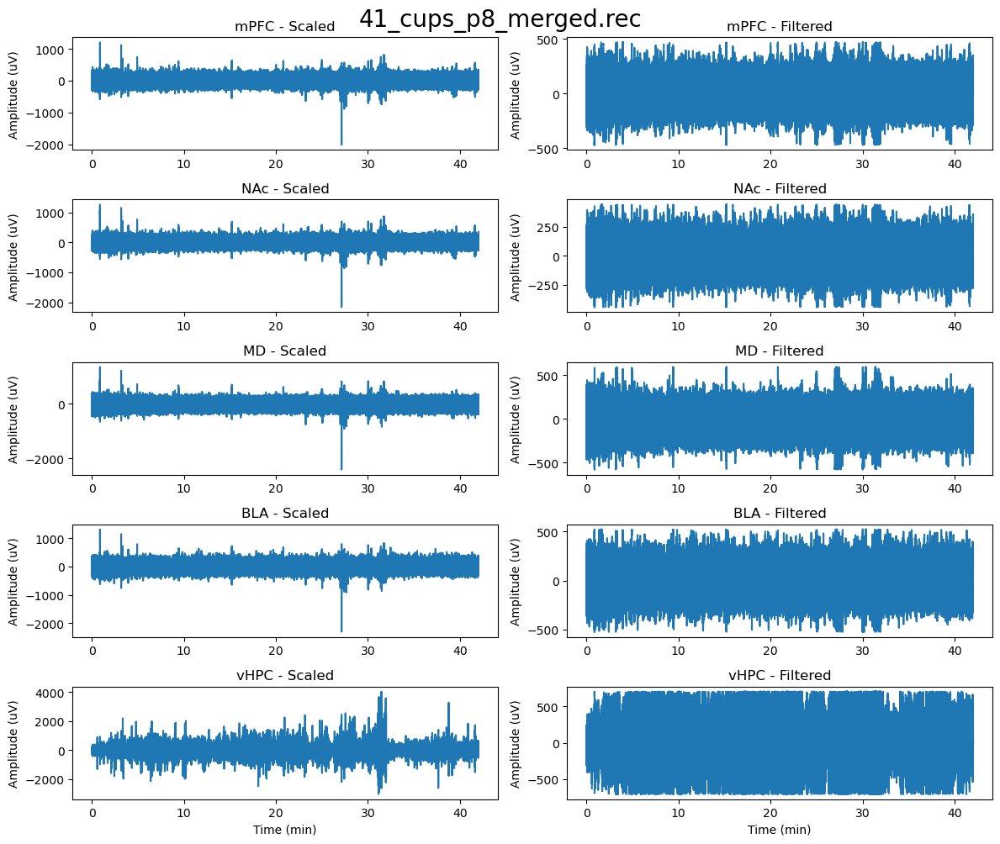

ValueError: x and y must have same first dimension, but have shapes (5042,) and (25210,)

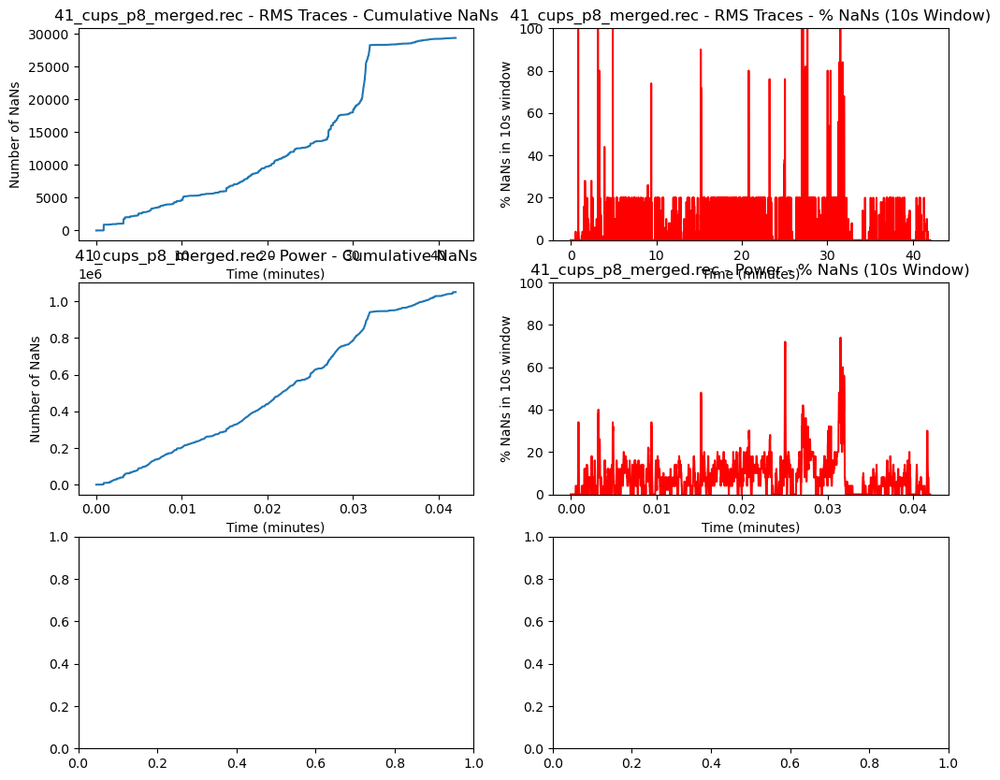

In [38]:
reload(preprocessor)
for recording in cups2_collection.lfp_recordings:
    plot_raw_and_filtered(recording, 5)
    nan_analysis(recording, 5)

In [ ]:

for recording in cups2_collection.lfp_recordings:
    print(recording.name)
    processed_data = process_data_with_threshold(recording, threshold=5, time_window=30)
    processed_data2 = process_data_with_threshold(recording, threshold=10000, time_window=30)
    plot_threshold_analysis(processed_data)
    plot_all_regions(processed_data['original_traces'], recording.brain_region_dict)
    #find_and_plot_nan_snippets(processed_data, region_idx = 0, window_size=500, max_snippets=3)
    rms_traces = processed_data['rms_traces']
    rms_traces2 = processed_data2['rms_traces']
    int_traces = processed_data['interpolated_rms']
    original_power = recording.power
    rms_power = connect.calculate_power(rms_traces, 1000, 2, 1, 0.5) 
    int_power = connect.calculate_power(int_traces, 1000, 2, 1, 0.5)
    rms_power2 = connect.calculate_power(rms_traces2, 1000, 2, 1, 0.5)
    
    print('original', original_power.shape, 'int', int_power.shape, 'rms', rms_power.shape, 'no filter', rms_power2.shape)
    power_averages(recording, events = ['cagemate', 'familiar', 'novel'], modes = [original_power, rms_power, int_power, rms_power2],
                   titles = ['original', 'RMS with Nans', 'RMS with Interpolation', 'RMS No Threshold'], plot = True )
    print('not int', np.isnan(rms_power).sum() / rms_power.size)
    print('int',  np.isnan(int_power).sum() / int_power.size)
    print('original', np.isnan(recording.power).sum() / recording.power.size)
    plot_nan_analysis(recording, powers = [original_power, rms_power, int_power, rms_power2], 
                      titles = [ 'original', 'Sliding Zscore with Nans', 'Sliding ZScore with Interpolation', 'No Threshold',], 
                      rms_traces = [recording.rms_traces, rms_traces, int_traces, rms_traces2, ],
                      window_size = 10)

In [ ]:

for recording in cups_collection.lfp_recordings:
    print(recording.name)
    processed_data = process_data_with_threshold(recording, threshold=5, time_window=30)
    processed_data2 = process_data_with_threshold(recording, threshold=10000, time_window=30)
    plot_threshold_analysis(processed_data)
    plot_all_regions(processed_data['original_traces'], recording.brain_region_dict)
    #find_and_plot_nan_snippets(processed_data, region_idx = 0, window_size=500, max_snippets=3)
    rms_traces = processed_data['rms_traces']
    rms_traces2 = processed_data2['rms_traces']
    int_traces = processed_data['interpolated_rms']
    original_power = recording.power
    rms_power = connect.calculate_power(rms_traces, 1000, 2, 1, 0.5) 
    int_power = connect.calculate_power(int_traces, 1000, 2, 1, 0.5)
    rms_power2 = connect.calculate_power(rms_traces2, 1000, 2, 1, 0.5)
    
 
    power_averages(recording, events = ['cagemate', 'familiar', 'novel'], modes = [original_power, rms_power, int_power, rms_power2],
                   titles = ['original', 'RMS with Nans', 'RMS with Interpolation', 'RMS No Threshold'], plot = True )
    print('not int', np.isnan(rms_power).sum() / rms_power.size)
    print('int',  np.isnan(int_power).sum() / int_power.size)
    print('original', np.isnan(recording.power).sum() / recording.power.size)
    plot_nan_analysis(recording, powers = [original_power, rms_power, int_power, rms_power2], 
                      titles = [ 'original', 'Sliding Zscore with Nans', 'Sliding ZScore with Interpolation', 'No Threshold',], 
                      rms_traces = [recording.rms_traces, rms_traces, int_traces, rms_traces2, ],
                      window_size = 10)
    

In [ ]:


target_df = []
target_df= pd.read_excel(r'pilot2/Target_confirmation_SME_pilot2.xlsx')
target_df = target_df.rename(columns = {'Nac':'NAc'})

for recording in cups_collection.lfp_recordings:
    bad_regions = []
    subject_info = target_df[target_df['Subject'].astype(str) == recording.subject]
    if subject_info.empty:
        print(f"Subject {recording.subject} not found in dataframe")
        continue
    
    # Check each region (column) except 'Subject'
    for region in subject_info.columns:
        if region != 'Subject':  # Skip the Subject column
            # Get the value for this region
            value = subject_info[region].values[0]
            
            # Check if the region is marked as bad
            if isinstance(value, str) and value.lower() == 'bad':
                bad_regions.append(recording.brain_region_dict[region])
    recording.bad_regions = bad_regions
    for region in bad_regions:
        recording.power[:, :, region] = np.nan
        recording.coherence[:,:,region, :] = np.nan
        recording.coherence[:,:, :, region] = np.nan
        recording.grangers[:,:,region, :] = np.nan
        recording.grangers[:,:,:region] = np.nan
        
for recording in cups2_collection.lfp_recordings:
    print(type(recording.subject))
    bad_regions = []
    subject_info = target_df[target_df['Subject'].astype(str) == str(recording.subject)]
    if subject_info.empty:
        print(f"Subject {recording.subject} not found in dataframe")
        
    else:
        print('hello')
    # Check each region (column) except 'Subject'
        for region in subject_info.columns:
            if region != 'Subject':  # Skip the Subject column
                # Get the value for this region
                value = subject_info[region].values[0]

                # Check if the region is marked as bad
                if isinstance(value, str) and value.lower() == 'bad':
                    bad_regions.append(recording.brain_region_dict[region])
        recording.bad_regions = bad_regions
        for region in bad_regions:
            recording.power[:, :, region] = np.nan
            recording.coherence[:,:,region, :] = np.nan
            recording.coherence[:,:, :, region] = np.nan
            recording.grangers[:,:,region, :] = np.nan
            recording.grangers[:,:,:region] = np.nan
        print(recording.subject)
        if str(recording.subject) == '3.1': 
            print('woo')
            cups2_collection.lfp_recordings.remove(recording)
print(len(cups2_collection.lfp_recordings))

24_cups_p4_merged.rec novel (57, 12, 500, 5)
23_cups_p4_merged.rec novel (17, 12, 500, 5)
21_cups_p4_merged.rec novel (18, 12, 500, 5)
31_cups_p4_merged.rec novel (59, 12, 500, 5)
11_cups_p4_merged.rec novel (18, 12, 500, 5)
13_cups_p4_merged.rec novel (12, 12, 500, 5)
44_cups_p4_merged.rec novel (6, 12, 500, 5)
22_cups_p4_merged.rec novel (5, 12, 500, 5)
32_cups_p4_merged.rec novel (11, 12, 500, 5)
41_cups_p4_merged.rec novel (27, 12, 500, 5)
24_cups_p4_merged.rec cagemate (24, 12, 500, 5)
23_cups_p4_merged.rec cagemate (31, 12, 500, 5)
21_cups_p4_merged.rec cagemate (48, 12, 500, 5)
31_cups_p4_merged.rec cagemate (8, 12, 500, 5)
11_cups_p4_merged.rec cagemate (20, 12, 500, 5)
13_cups_p4_merged.rec cagemate (27, 12, 500, 5)
44_cups_p4_merged.rec cagemate (25, 12, 500, 5)
22_cups_p4_merged.rec cagemate (54, 12, 500, 5)
32_cups_p4_merged.rec cagemate (20, 12, 500, 5)
41_cups_p4_merged.rec cagemate (37, 12, 500, 5)
24_cups_p4_merged.rec familiar (21, 12, 500, 5)
23_cups_p4_merged.rec fam

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:378: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.nanmean(np.array(baseline_averages), axis=0), axis = 0)


24_cups_p4_merged.rec novel (54, 80, 500, 5)
23_cups_p4_merged.rec novel (17, 80, 500, 5)
21_cups_p4_merged.rec novel (16, 80, 500, 5)
31_cups_p4_merged.rec novel (59, 80, 500, 5)
11_cups_p4_merged.rec novel (18, 80, 500, 5)
13_cups_p4_merged.rec novel (12, 80, 500, 5)
44_cups_p4_merged.rec novel (6, 80, 500, 5)
22_cups_p4_merged.rec novel (5, 80, 500, 5)
32_cups_p4_merged.rec novel (11, 80, 500, 5)
41_cups_p4_merged.rec novel (25, 80, 500, 5)
(80, 500, 5)


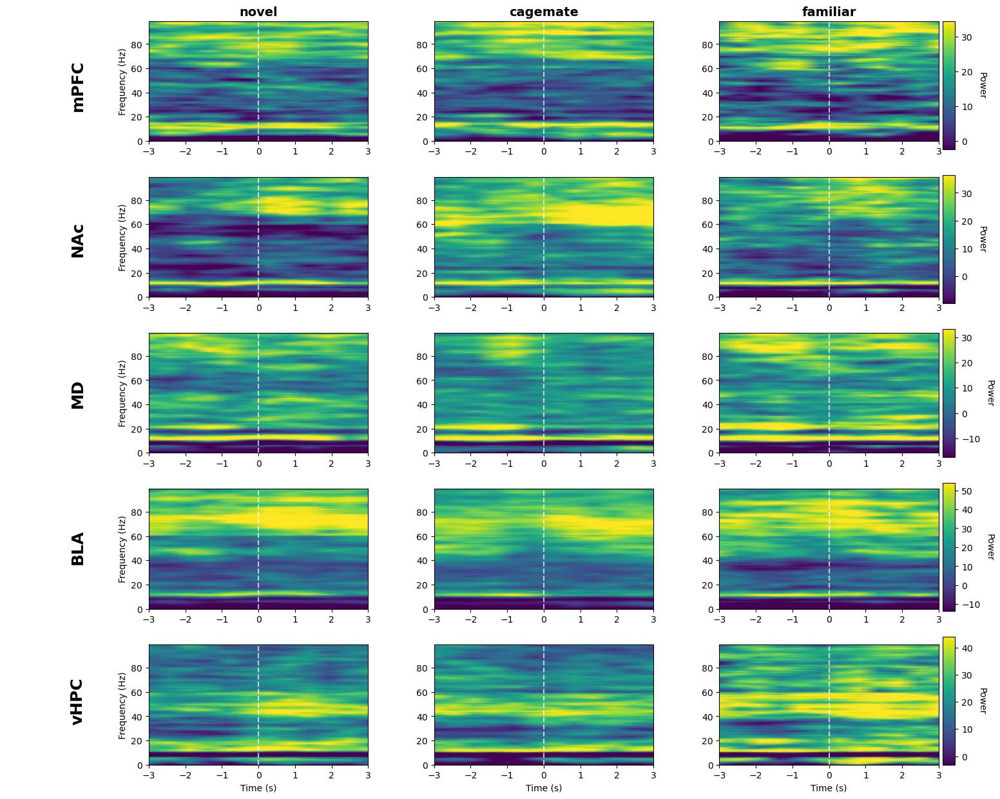

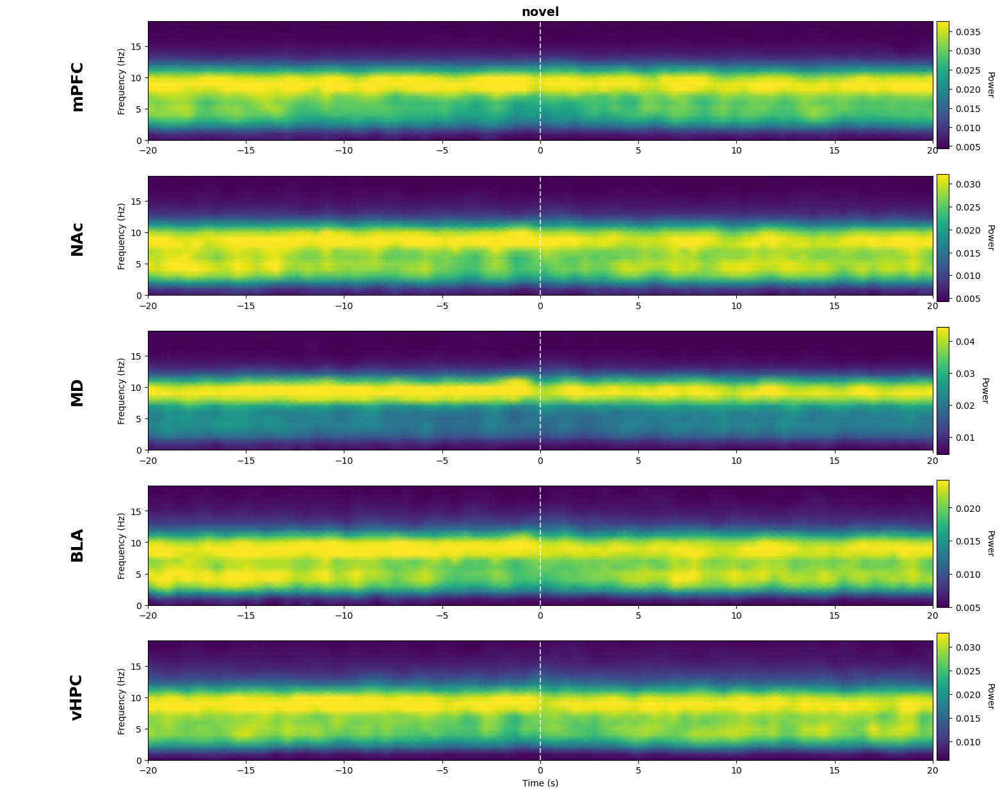

In [12]:
from importlib import reload
from lfp.lfp_analysis.LFP_collection import LFPCollection
from lfp.lfp_analysis.LFP_recording import LFPRecording
reload(lfpa)
def plot_spectogram(lfp_collection, events, mode, event_len, baseline=None, pre_window = 0, post_window = 0, freq_range=(0,100)):
      # Process collection vs single recording
    if isinstance(lfp_collection, LFPCollection):
        recordings = lfp_collection.lfp_recordings
    elif isinstance(lfp_collection, LFPRecording):
        recordings = [lfp_collection]
    elif isinstance(lfp_collection, list): 
        recordings = lfp_collection
    else:
        raise TypeError("lfp_collection must be either LFPCollection or LFPRecording")
    
    # Dictionary to store the average event data for each event type
    event_averages_dict = {}
    
    # Process each event type
    for i in range(len(events)):
        all_events = []
        for recording in recordings:
            # Events shape: [trials, time, freq, regions]
            recording_events = lfpa.__get_events__(recording, events[i], mode, event_len, 
                                                  pre_window, post_window, average=False)
            print(recording.name, events[i], np.array(recording_events).shape)
            if baseline is not None:
                adj_averages = lfpa.__baseline_diff__(
                    recording, recording_events, baseline[i], mode, event_len, 
                    pre_window=0, post_window=0, average = False
                )
                all_events.extend(adj_averages)
            else:
                all_events.extend(recording_events)
        
        # Calculate average across trials for this event type
        average_event = np.nanmean(np.array(all_events), axis=0)
        event_averages_dict[events[i]] = average_event
    
    # Get dimensions and axes from the first event (assuming all have same shape)
   
    first_event = list(event_averages_dict.values())[0]
    print(first_event.shape)
    n_timepoints, n_freqs, n_regions = first_event.shape
   
        
    time_axis = np.linspace(-pre_window, event_len+post_window, n_timepoints)
    freq_axis = range(freq_range[0], freq_range[1])

        # Get region names
    region_names = [f'{cups_collection.brain_region_dict.inverse[i]}' for i in range(n_regions)]

    # Calculate vmin and vmax per brain region across all events
    region_bounds = []
    for region_idx in range(n_regions):
        # Collect data for this region across all events
        region_data = np.array([])
        for event_data in event_averages_dict.values():
            # Extract only the frequency range we want to display 
            sliced_data = event_data[:, freq_range[0]:freq_range[1], region_idx]
            if region_data.size == 0:
                region_data = sliced_data.flatten()
            else:
                region_data = np.concatenate([region_data, sliced_data.flatten()])
        # Calculate percentiles for this region's data
        region_vmin = np.percentile(region_data, 5)  # 5th percentile to avoid outliers
        region_vmax = np.percentile(region_data, 95)  # 95th percentile to avoid outliers
        
        # Store bounds for this region
        region_bounds.append((region_vmin, region_vmax))
    
    # Setup figure layout - rows are brain regions, columns are event types
    n_rows = n_regions
    n_cols = len(events)
    
    # Adjust figure size based on number of subplots
    fig_size = (15, 10)
    adjusted_width = max(fig_size[0], 4 * n_cols)
    adjusted_height = max(fig_size[1], 3 * n_rows)
    
    # Create figure with extra space for everything
    fig = plt.figure(figsize=(adjusted_width + 4, adjusted_height))
    
    # Create layout with extra space for labels and colorbars
    # Main gridspec for all content
    outer_gs = fig.add_gridspec(1, 2, width_ratios=[0.15, 0.85], wspace=0.0)
    # Left side for region labels
    labels_gs = outer_gs[0].subgridspec(n_rows, 1)
    # Right side for plots and colorbars
    right_gs = outer_gs[1].subgridspec(1, 2, width_ratios=[0.95, 0.015], wspace=0.01)
    # Further divide the plots area into a grid for each region and event
    plots_gs = right_gs[0].subgridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    # And the colorbar area into a column for each region
    cbar_gs = right_gs[1].subgridspec(n_rows, 1)
    
    # Create axes
    label_axes = []
    plot_axes = []
    cbar_axes = []
    
    # Create label axes
    for row_idx in range(n_rows):
        label_ax = fig.add_subplot(labels_gs[row_idx, 0])
        label_ax.axis('off')  # Hide axis elements
        label_axes.append(label_ax)
    
    # Create plot axes
    for row_idx in range(n_rows):
        row_axes = []
        for col_idx in range(n_cols):
            ax = fig.add_subplot(plots_gs[row_idx, col_idx])
            row_axes.append(ax)
        plot_axes.append(row_axes)
    
    # Create colorbar axes
    for row_idx in range(n_rows):
        cbar_ax = fig.add_subplot(cbar_gs[row_idx, 0])
        cbar_axes.append(cbar_ax)
    
    # Add the region labels
    for row_idx, region_idx in enumerate(range(n_regions)):
        if row_idx < len(region_names):
            label_axes[row_idx].text(0.5, 0.5, region_names[region_idx],
                                     fontsize=18, fontweight='bold',
                                     rotation=90, ha='center', va='center',
                                     transform=label_axes[row_idx].transAxes)
    
    # Plot spectrograms and add colorbars
    for row_idx, region_idx in enumerate(range(n_regions)):
        region_vmin, region_vmax = region_bounds[region_idx]
        
        # Reference to store the last image for colorbar
        region_im = None
        
        # Plot each event for this region
        for col_idx, event in enumerate(events):
            ax = plot_axes[row_idx][col_idx]
            
            # Get the event data for this specific region
            event_data = event_averages_dict[event][:, freq_range[0]:freq_range[1], region_idx].T
            
            # Plot the spectrogram
            im = ax.pcolormesh(time_axis, freq_axis, event_data,
                              cmap='viridis', vmin=region_vmin, vmax=region_vmax, shading='gouraud')
            
            region_im = im  # Save for colorbar
            
            # Add vertical line at t=0 (event onset)
            ax.axvline(x=0, color='white', linestyle='--', alpha=0.7)
            
            # Set labels only on left and bottom edges
            if col_idx == 0:
                ax.set_ylabel('Frequency (Hz)')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)')
            
            # Add event type title
            if row_idx == 0:
                ax.set_title(f"{event}", fontsize=14, fontweight='bold')
        
        # Add colorbar for this region
        if region_im is not None:
            cbar = plt.colorbar(region_im, cax=cbar_axes[row_idx])
            cbar.set_label('Power', rotation=270, labelpad=15)
    
    # Add overall title
    #fig.suptitle(f'Spectrograms by Brain Region and Event Type', fontsize=16, y=0.98)
    
                
plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'power', event_len = 3, pre_window = 3, freq_range = (0, 100))
plot_spectogram(cups_collection, events = ['novel'], baseline = None, mode = 'power', event_len = 20, pre_window = 20, freq_range = (0, 20))

# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (15, 25))
# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (25, 35))
# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (35, 50))
# plot_spectogram(cups_collection, events = ['novel', 'cagemate', 'familiar'], mode = 'power', event_len = 5, pre_window = 5, freq_range = (50, 70))

41_cups_p8_merged.rec novel (23, 12, 500, 5)
23_cups_p8_merged.rec novel (16, 12, 500, 5)
44_cups_p8_merged.rec novel (15, 12, 500, 5)
22_cups_p8_merged.rec novel (17, 12, 500, 5)
32_cups_p8_merged.rec novel (11, 12, 500, 5)
41_cups_p8_merged.rec cagemate (25, 12, 500, 5)
23_cups_p8_merged.rec cagemate (18, 12, 500, 5)
44_cups_p8_merged.rec cagemate (18, 12, 500, 5)
22_cups_p8_merged.rec cagemate (28, 12, 500, 5)
32_cups_p8_merged.rec cagemate (23, 12, 500, 5)
41_cups_p8_merged.rec familiar (30, 12, 500, 5)
23_cups_p8_merged.rec familiar (27, 12, 500, 5)
44_cups_p8_merged.rec familiar (9, 12, 500, 5)
22_cups_p8_merged.rec familiar (7, 12, 500, 5)
32_cups_p8_merged.rec familiar (10, 12, 500, 5)
(12, 500, 5)


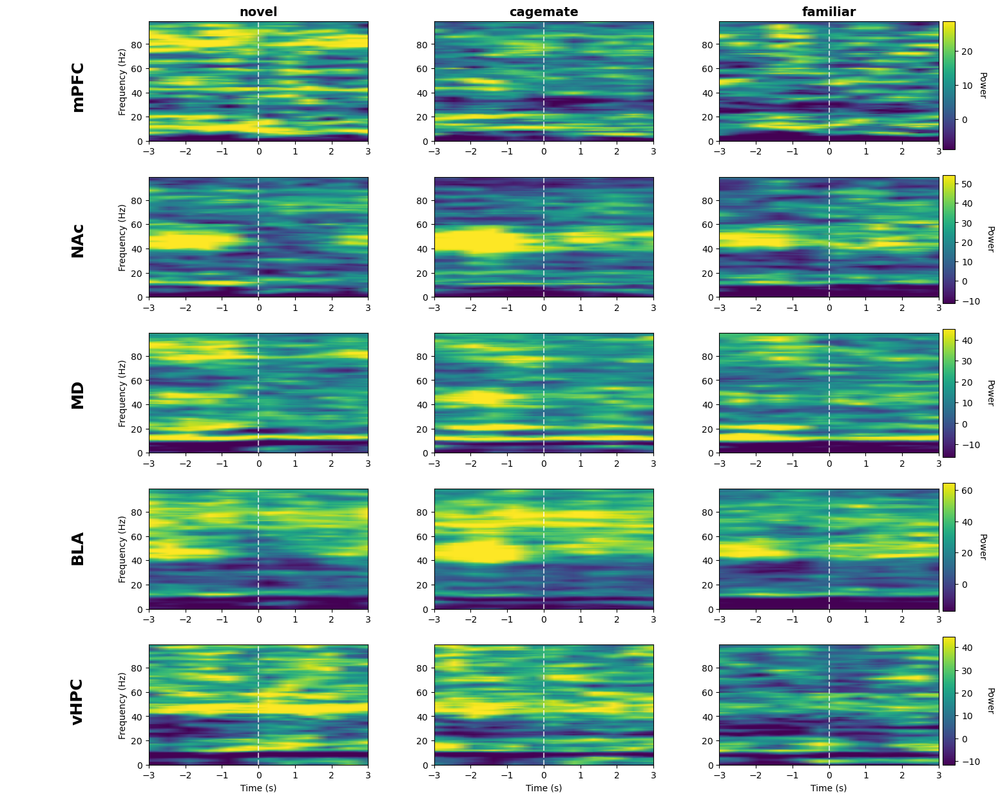

In [13]:
temp_rec_list = []
for recording in cups_collection.lfp_recordings: 
    if str(recording.subject) in ['4.1', '2.3', '2.2', '3.2', '4.4']:
        temp_rec_list.append(recording) 
        
plot_spectogram(cups2_collection, events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'power', event_len = 3, pre_window = 3, freq_range = (0, 100))


23_cups_p4_merged.rec novel (17, 12, 500, 5)
44_cups_p4_merged.rec novel (6, 12, 500, 5)
22_cups_p4_merged.rec novel (5, 12, 500, 5)
32_cups_p4_merged.rec novel (11, 12, 500, 5)
41_cups_p4_merged.rec novel (27, 12, 500, 5)
23_cups_p4_merged.rec cagemate (31, 12, 500, 5)
44_cups_p4_merged.rec cagemate (25, 12, 500, 5)
22_cups_p4_merged.rec cagemate (54, 12, 500, 5)
32_cups_p4_merged.rec cagemate (20, 12, 500, 5)
41_cups_p4_merged.rec cagemate (37, 12, 500, 5)
23_cups_p4_merged.rec familiar (29, 12, 500, 5)
44_cups_p4_merged.rec familiar (5, 12, 500, 5)
22_cups_p4_merged.rec familiar (6, 12, 500, 5)
32_cups_p4_merged.rec familiar (9, 12, 500, 5)
41_cups_p4_merged.rec familiar (25, 12, 500, 5)
(12, 500, 5)


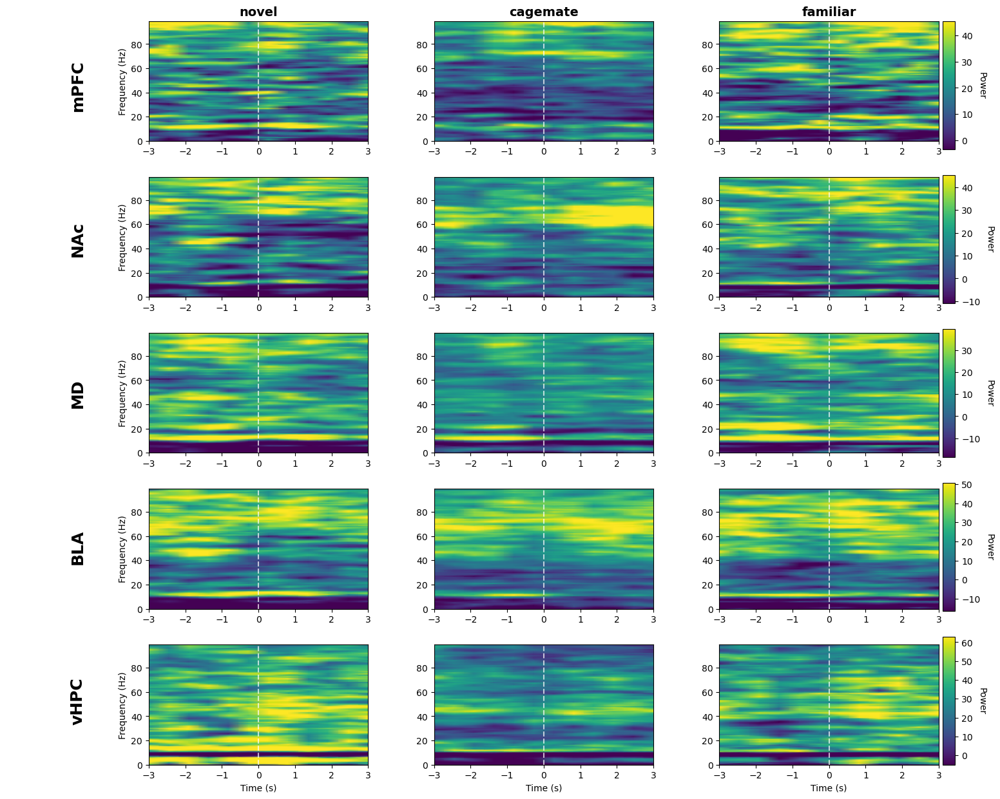

In [14]:
plot_spectogram(temp_rec_list, events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'power', event_len = 3, pre_window = 3, freq_range = (0, 100))


In [15]:
def plot_power_averages(lfp_collection, event_averages, freq_range, peak_height, peak_width, distance, threshold_percent=50, range_limit = None):
    import numpy as np
    from scipy import stats
    from scipy.signal import find_peaks
    import matplotlib.pyplot as plt
    

    regions = lfp_collection.brain_region_dict.keys()
    if freq_range is None:
        freq_range = [1, 101]
    ranges = []
    for region in regions:
        plt.figure(figsize=(10, 5))
        for event, averages in event_averages.items():
            # averages = [trials, f, b]
            averages = event_averages[event]
            event_average = np.nanmean(averages, axis=0)
            # event_average = [f,b]; average across all trials
            # calculate sem for the trial average
            event_sem = stats.sem(averages, axis=0, nan_policy="omit")
            region_index = lfp_collection.brain_region_dict[region]
            # pick only the region of interest
            y = event_average[freq_range[0]:freq_range[1], region_index]
            y_sem = event_sem[freq_range[0]:freq_range[1], region_index]
            x = range(freq_range[0], freq_range[1])
            (line,) = plt.plot(x, y, label=event)
            plt.fill_between(x, y - y_sem, y + y_sem, alpha=0.2, color=line.get_color())
            
            # Find peaks and mark them with red dots
            peak_indices, properties = find_peaks(y, height=peak_height, width=peak_width, distance = distance)
            # Adjust indices to match the x range
            peak_x = [x[i] for i in peak_indices]
            peak_y = [y[i] for i in peak_indices]
            plt.scatter(peak_x, peak_y, color='red', s=80, zorder=3)
            trough_indices, _ = find_peaks(-y, height=peak_height, width=peak_width, distance = distance)  # Negate data to find troughs
            trough_x = [x[i] for i in trough_indices]
            trough_y = [y[i] for i in trough_indices]
            plt.scatter(trough_x, trough_y, color='blue', s=80, zorder=3, label='_nolegend_')
            ranges_interest = []
            for i, peak_idx in enumerate(peak_indices):
                peak_value = y[peak_idx]
                threshold = peak_value * (threshold_percent / 100)
                
                # Find left boundary (point that passes threshold on the left)
                left_idx = peak_idx
                while left_idx > 0 and y[left_idx] > threshold:
                    left_idx -= 1
                
                # Find right boundary (point that passes threshold on the right)
                right_idx = peak_idx
                while right_idx < len(y) - 1 and y[right_idx] > threshold:
                    right_idx += 1
                
                # Highlight this region
                if range_limit is not None:
                    if right_idx - left_idx > range_limit:
                        plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='orange', label='_nolegend_')
                        ranges_interest.append([left_idx, right_idx])
                else:  
                    plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='orange', label='_nolegend_')
                    ranges_interest.append([left_idx, right_idx])
            # Process each trough
            for i, trough_idx in enumerate(trough_indices):
                trough_value = y[trough_idx]
                # For troughs, we want to find where the signal rises above X% of the distance from the trough to the baseline
                # Estimate "baseline" as the mean of the signal
                baseline = np.mean(y)
                # Calculate the threshold as a point X% of the way from trough to baseline
                threshold = trough_value + (baseline - trough_value) * (threshold_percent / 100)
                
                # Find left boundary (point that passes above threshold on the left)
                left_idx = trough_idx
                while left_idx > 0 and y[left_idx] < threshold:
                    left_idx -= 1
                
                # Find right boundary (point that passes above threshold on the right)
                right_idx = trough_idx
                while right_idx < len(y) - 1 and y[right_idx] < threshold:
                    right_idx += 1
                
                # Highlight this region
                if range_limit is not None: 
                    if right_idx - left_idx > range_limit:
                        plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='lightblue', label='_nolegend_')
                        ranges_interest.append([left_idx, right_idx])
                else:
                    plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='lightblue', label='_nolegend_')
                    ranges_interest.append([left_idx, right_idx])
        ranges.append(ranges_interest)
        ymin, ymax = plt.ylim()
        # plt.axvline(x=12, color="gray", linestyle="--", linewidth=0.5)
        # plt.axvline(x=4, color="gray", linestyle="--", linewidth=0.5)
        # plt.fill_betweenx(y=np.linspace(ymin, ymax, 80), x1=4, x2=12, color="red", alpha=0.1)
        plt.ylim(ymin, ymax)
        plt.title(f"{region} power")
        plt.legend()
        plt.show()
    return ranges
def plot_coherence_averages(lfp_collection, event_averages, freq_range, peak_height, peak_width, distance, threshold_percent=50, range_limit = None):

    brain_regions = list(lfp_collection.brain_region_dict.values())
    pair_indices = list(combinations(brain_regions, 2))
    #ranges = []
    coherence_ranges = [[[] for _ in brain_regions] for _ in brain_regions]
    if freq_range is None:
        freq_range = [1,101]
    for i in range(len(pair_indices)):
        for event, averages in event_averages.items():
            # averages = [trials, f, b, b]
            first_region, second_region = list(pair_indices[i])
            first_region_name = lfp_collection.brain_region_dict.inverse[first_region]
            second_region_name = lfp_collection.brain_region_dict.inverse[second_region]
            averages = event_averages[event]
            event_average = np.nanmean(np.array(averages), axis=0)
            # event_average = [f, b, b]; average across all trials
            # calculate sem for the trial average
            event_sem = stats.sem(averages, axis=0, nan_policy="omit")
            # pick only the region of interest
            y_sem = event_sem[freq_range[0]:freq_range[1], first_region, second_region]
            y = event_average[freq_range[0]:freq_range[1], first_region, second_region]
            x = range(freq_range[0],freq_range[1])
            (line,) = plt.plot(x, y, label=event)
            plt.fill_between(x, y - y_sem, y + y_sem, color=line.get_color(), alpha=0.2)
            # Find peaks and mark them with red dots
            peak_indices, properties = find_peaks(y, height=peak_height, width=peak_width, distance = distance)
            # Adjust indices to match the x range
            peak_x = [x[i] for i in peak_indices]
            peak_y = [y[i] for i in peak_indices]
            plt.scatter(peak_x, peak_y, color='red', s=80, zorder=3)
            trough_indices, _ = find_peaks(-y, height=peak_height, width=peak_width, distance = distance)  # Negate data to find troughs
            trough_x = [x[i] for i in trough_indices]
            trough_y = [y[i] for i in trough_indices]
            plt.scatter(trough_x, trough_y, color='blue', s=80, zorder=3, label='_nolegend_')
            ranges_interest = []
            for i, peak_idx in enumerate(peak_indices):
                peak_value = y[peak_idx]
                threshold = peak_value * (threshold_percent / 100)
                
                # Find left boundary (point that passes threshold on the left)
                left_idx = peak_idx
                while left_idx > 0 and y[left_idx] > threshold:
                    left_idx -= 1
                
                # Find right boundary (point that passes threshold on the right)
                right_idx = peak_idx
                while right_idx < len(y) - 1 and y[right_idx] > threshold:
                    right_idx += 1
                
                # Highlight this region
                if range_limit is not None:
                    if right_idx - left_idx > range_limit:
                        plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='orange', label='_nolegend_')
                        ranges_interest.append([left_idx, right_idx])
                else:
                    plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='orange', label='_nolegend_')
                    ranges_interest.append([left_idx, right_idx])
            # Process each trough
            for i, trough_idx in enumerate(trough_indices):
                trough_value = y[trough_idx]
                # For troughs, we want to find where the signal rises above X% of the distance from the trough to the baseline
                # Estimate "baseline" as the mean of the signal
                baseline = np.mean(y)
                # Calculate the threshold as a point X% of the way from trough to baseline
                threshold = trough_value + (baseline - trough_value) * (threshold_percent / 100)
                
                # Find left boundary (point that passes above threshold on the left)
                left_idx = trough_idx
                while left_idx > 0 and y[left_idx] < threshold:
                    left_idx -= 1
                
                # Find right boundary (point that passes above threshold on the right)
                right_idx = trough_idx
                while right_idx < len(y) - 1 and y[right_idx] < threshold:
                    right_idx += 1
                
                # Highlight this region
                if range_limit is not None: 
                    if right_idx - left_idx > range_limit:
                        plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='lightblue', label='_nolegend_')
                        ranges_interest.append([left_idx, right_idx])
                else:
                    plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='lightblue', label='_nolegend_')
                    ranges_interest.append([left_idx, right_idx])
        coherence_ranges[first_region][second_region] = ranges_interest
        ymin, ymax = plt.ylim()
        # plt.axvline(x=12, color="gray", linestyle="--", linewidth=0.5)
        # plt.axvline(x=4, color="gray", linestyle="--", linewidth=0.5)
        # plt.fill_betweenx(y=np.linspace(ymin, ymax, 80), x1=4, x2=12, color="red", alpha=0.1)
        plt.ylim(ymin, ymax)
        plt.title(f"{first_region_name} & {second_region_name} coherence")
        plt.legend()
        plt.show()
    return coherence_ranges

def plot_granger_averages(lfp_collection, event_averages, freq_range, peak_height, peak_width, distance, threshold_percent=50, range_limit = None):

    brain_regions = list(lfp_collection.brain_region_dict.values())
    pair_indices = list(permutations(brain_regions, 2))
    granger_ranges = [[[] for _ in brain_regions] for _ in brain_regions]
    if freq_range is None:
        freq_range = [1,101]
    for i in range(len(pair_indices)):
        for event, averages in event_averages.items():
            # averages = [trials, f, b, b]
            first_region, second_region = list(pair_indices[i])
            first_region_name = lfp_collection.brain_region_dict.inverse[first_region]
            second_region_name = lfp_collection.brain_region_dict.inverse[second_region]
            averages = event_averages[event]
            event_average = np.nanmean(np.array(averages), axis=0)
            # event_average = [f, b, b]; average across all trials
            # calculate sem for the trial average
            event_sem = stats.sem(averages, axis=0, nan_policy="omit")
            # pick only the region of interest
            y_sem = event_sem[freq_range[0]:freq_range[1], first_region, second_region]
            y = event_average[freq_range[0]:freq_range[1], first_region, second_region]
            x = range(freq_range[0],freq_range[1])
            (line,) = plt.plot(x, y, label=event)
            plt.fill_between(x, y - y_sem, y + y_sem, color=line.get_color(), alpha=0.2)
            # Find peaks and mark them with red dots
            peak_indices, properties = find_peaks(y, height=peak_height, width=peak_width, distance = distance)
            # Adjust indices to match the x range
            peak_x = [x[i] for i in peak_indices]
            peak_y = [y[i] for i in peak_indices]
            plt.scatter(peak_x, peak_y, color='red', s=80, zorder=3)
            trough_indices, _ = find_peaks(-y, height=peak_height, width=peak_width, distance = distance)  # Negate data to find troughs
            trough_x = [x[i] for i in trough_indices]
            trough_y = [y[i] for i in trough_indices]
            plt.scatter(trough_x, trough_y, color='blue', s=80, zorder=3, label='_nolegend_')
            ranges_interest = []
            for i, peak_idx in enumerate(peak_indices):
                peak_value = y[peak_idx]
                threshold = peak_value * (threshold_percent / 100)
                
                # Find left boundary (point that passes threshold on the left)
                left_idx = peak_idx
                while left_idx > 0 and y[left_idx] > threshold:
                    left_idx -= 1
                
                # Find right boundary (point that passes threshold on the right)
                right_idx = peak_idx
                while right_idx < len(y) - 1 and y[right_idx] > threshold:
                    right_idx += 1
                
                # Highlight this region
                if range_limit is not None:
                    if right_idx - left_idx > range_limit:
                        plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='orange', label='_nolegend_')
                        ranges_interest.append([left_idx, right_idx])
                else:
                    plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='orange', label='_nolegend_')
                    ranges_interest.append([left_idx, right_idx])
            # Process each trough
            for i, trough_idx in enumerate(trough_indices):
                trough_value = y[trough_idx]
                # For troughs, we want to find where the signal rises above X% of the distance from the trough to the baseline
                # Estimate "baseline" as the mean of the signal
                baseline = np.mean(y)
                # Calculate the threshold as a point X% of the way from trough to baseline
                threshold = trough_value + (baseline - trough_value) * (threshold_percent / 100)
                
                # Find left boundary (point that passes above threshold on the left)
                left_idx = trough_idx
                while left_idx > 0 and y[left_idx] < threshold:
                    left_idx -= 1
                
                # Find right boundary (point that passes above threshold on the right)
                right_idx = trough_idx
                while right_idx < len(y) - 1 and y[right_idx] < threshold:
                    right_idx += 1
                
                # Highlight this region
                if range_limit is not None: 
                    if right_idx - left_idx > range_limit:
                        plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='lightblue', label='_nolegend_')
                        ranges_interest.append([left_idx, right_idx])
                else:
                    plt.axvspan(x[left_idx], x[right_idx], alpha=0.3, color='lightblue', label='_nolegend_')
                    ranges_interest.append([left_idx, right_idx])
        granger_ranges[first_region][second_region] = ranges_interest
        ymin, ymax = plt.ylim()
        # plt.axvline(x=12, color="gray", linestyle="--", linewidth=0.5)
        # plt.axvline(x=4, color="gray", linestyle="--", linewidth=0.5)
        # plt.fill_betweenx(y=np.linspace(ymin, ymax, 80), x1=4, x2=12, color="red", alpha=0.1)
        plt.ylim(ymin, ymax)
        plt.title(f"{first_region_name} & {second_region_name} granger")
        plt.legend()
        plt.show()
    return granger_ranges

In [16]:
reload(lfpa)
from scipy.signal import find_peaks


diff = lfpa.event_difference(cups_collection, 'cagemate', 'cagemate_baseline', mode = 'power', plot=False)
coh_diff = lfpa.event_difference(cups_collection, 'cagemate', 'cagemate_baseline', mode = 'coherence', plot=False)
grang_diff = lfpa.event_difference(cups_collection, 'cagemate', 'cagemate_baseline', mode = 'granger', plot=False)


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)


In [17]:
# peak_height = 10
# distance = 10
# peak_width = 3
# threshold_percent = 50

# power_ranges = plot_power_averages(cups_collection, averages, freq_range = (0,120), peak_height= peak_height, peak_width = peak_width, distance = distance, threshold_percent=threshold_percent)
# coherence_ranges = plot_coherence_averages(cups_collection, coh_diff, freq_range = (0,120), peak_height= peak_height, peak_width = peak_width, distance = distance,  threshold_percent = threshold_percent)
# granger_ranges = plot_granger_averages(cups_collection, grang_diff, freq_range = (0,120), peak_height= peak_height, peak_width = peak_width, distance = distance, threshold_percent = threshold_percent)
# total_power_features = 0
# total_granger_features = 0
# total_coherence_features = 0 
# for i in range(len(power_ranges)):
#     total_power_features += len(power_ranges[i])
# for i in range(len(coherence_ranges)):
#     total_coherence_features += len(coherence_ranges[i])
# for i in range(len(granger_ranges)):
#     total_granger_features += len(granger_ranges[i])
    
# print(total_power_features, total_coherence_features, total_granger_features)
    

/scratch/local/65741798/ipykernel_3481685/1263455880.py:57: RuntimeWarning: Mean of empty slice
  average_event = np.nanmean(np.array(all_events), axis=0)


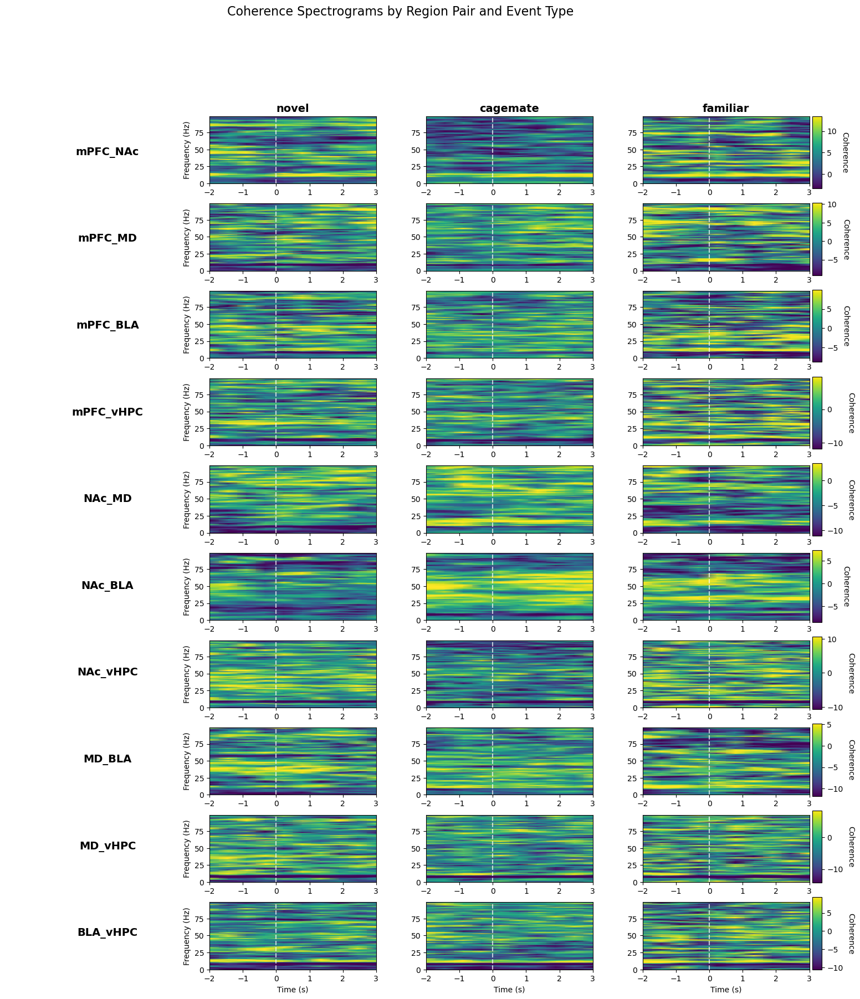

In [18]:
def plot_coherence_causality(lfp_collection, events, mode, event_len, measure_type="coherence", baseline=None, pre_window=0, post_window=0, freq_range=(0,100)):
    """
    Plot coherence or Granger causality spectrograms for unique combinations of brain regions.
    
    Parameters:
    -----------
    lfp_collection : LFPCollection or LFPRecording
        Collection of LFP recordings or a single recording
    events : list
        List of event types to analyze
    mode : str
        Analysis mode
    event_len : float
        Duration of event in seconds
    measure_type : str
        Type of measure to plot ('coherence' or 'granger')
    baseline : str, optional
        Baseline event type for normalization
    pre_window : float, optional
        Time before event onset to include
    post_window : float, optional
        Time after event end to include
    freq_range : tuple, optional
        Range of frequencies to plot (min, max)
    """
    # Process collection vs single recording
    
    if isinstance(lfp_collection, LFPCollection):
        recordings = lfp_collection.lfp_recordings
    elif isinstance(lfp_collection, LFPRecording):
        recordings = [lfp_collection]
    else:
        raise TypeError("lfp_collection must be either LFPCollection or LFPRecording")
    
    # Dictionary to store the average event data for each event type
    event_averages_dict = {}
    
    # Process each event type
    for i in range(len(events)):
        all_events = []
        for recording in recordings:
            # Events shape: [trials, time, freq, regions, regions]
            recording_events = lfpa.__get_events__(recording, events[i], mode, event_len, 
                                                  pre_window, post_window, average=False)
            
            if baseline is not None:
                # TODO: edit this to work with not averages 
                adj_averages = lfpa.__baseline_diff__(
                    recording, recording_events, baseline[i], mode, event_len, 
                    pre_window=0, post_window=0, average = False
                )
                all_events.extend(adj_averages)
            else:
                all_events.extend(recording_events)
        
        # Calculate average across trials for this event type
        average_event = np.nanmean(np.array(all_events), axis=0)
        event_averages_dict[events[i]] = average_event
    
    # Get dimensions and axes from the first event
    first_event = list(event_averages_dict.values())[0]
    n_timepoints, n_freqs, n_regions, _ = first_event.shape
    time_axis = np.linspace(-pre_window, event_len+post_window, n_timepoints)
    freq_axis = range(freq_range[0], freq_range[1])
    
    # Get region names
    region_names = [f'{cups_collection.brain_region_dict.inverse[i]}' for i in range(n_regions)]
    
    # Generate unique region pairs (no self-pairs, only one direction)
    region_pairs = []
    region_pair_indices = []
    
    for i in range(n_regions):
        for j in range(i+1, n_regions):  # Start from i+1 to avoid self-pairs and duplicates
            region_pairs.append(f"{region_names[i]}_{region_names[j]}")
            region_pair_indices.append((i, j))
    
    n_pairs = len(region_pairs)
    
    # Calculate vmin and vmax per region pair across all events
    pair_bounds = []
    for pair_idx, (region_i, region_j) in enumerate(region_pair_indices):
        # Collect data for this region pair across all events
        pair_data = np.array([])
        for event_data in event_averages_dict.values():
            # Extract only the frequency range we want to display
            sliced_data = event_data[:, freq_range[0]:freq_range[1], region_i, region_j]
            if pair_data.size == 0:
                pair_data = sliced_data.flatten()
            else:
                pair_data = np.concatenate([pair_data, sliced_data.flatten()])
        
        # Calculate percentiles for this pair's data
        pair_vmin = np.percentile(pair_data, 5)
        pair_vmax = np.percentile(pair_data, 95)
        
        # Store bounds for this pair
        pair_bounds.append((pair_vmin, pair_vmax))
    
    # Setup figure layout - rows are region pairs, columns are event types
    n_rows = n_pairs
    n_cols = len(events)
    
    # Adjust figure size based on number of subplots
    fig_size = (15, 10)
    adjusted_width = max(fig_size[0], 4 * n_cols)
    adjusted_height = max(fig_size[1], 2 * n_rows)  # Increase height for more region pairs
    
    # Create figure with extra space for everything
    fig = plt.figure(figsize=(adjusted_width + 4, adjusted_height))
    
    # Create layout with extra space for labels and colorbars
    # Main gridspec for all content
    outer_gs = fig.add_gridspec(1, 2, width_ratios=[0.25, 0.75], wspace=0.0)  # Wider left side for longer pair labels
    
    # Left side for region pair labels
    labels_gs = outer_gs[0].subgridspec(n_rows, 1)
    
    # Right side for plots and colorbars
    right_gs = outer_gs[1].subgridspec(1, 2, width_ratios=[0.985, 0.015], wspace=0.01)
    
    # Further divide the plots area into a grid for each region pair and event
    plots_gs = right_gs[0].subgridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # And the colorbar area into a column for each region pair
    cbar_gs = right_gs[1].subgridspec(n_rows, 1)
    
    # Create axes
    label_axes = []
    plot_axes = []
    cbar_axes = []
    
    # Create label axes
    for row_idx in range(n_rows):
        label_ax = fig.add_subplot(labels_gs[row_idx, 0])
        label_ax.axis('off')  # Hide axis elements
        label_axes.append(label_ax)
    
    # Create plot axes
    for row_idx in range(n_rows):
        row_axes = []
        for col_idx in range(n_cols):
            ax = fig.add_subplot(plots_gs[row_idx, col_idx])
            row_axes.append(ax)
        plot_axes.append(row_axes)
    
    # Create colorbar axes
    for row_idx in range(n_rows):
        cbar_ax = fig.add_subplot(cbar_gs[row_idx, 0])
        cbar_axes.append(cbar_ax)
    
    # Add the region pair labels
    for row_idx, pair_name in enumerate(region_pairs):
        label_axes[row_idx].text(0.5, 0.5, pair_name,
                                 fontsize=14, fontweight='bold',
                                 rotation=0, ha='center', va='center',
                                 transform=label_axes[row_idx].transAxes)
    
    # Plot spectrograms and add colorbars
    for row_idx, (region_i, region_j) in enumerate(region_pair_indices):
        pair_vmin, pair_vmax = pair_bounds[row_idx]
        
        # Reference to store the last image for colorbar
        pair_im = None
        
        # Plot each event for this region pair
        for col_idx, event in enumerate(events):
            ax = plot_axes[row_idx][col_idx]
            
            # Get the event data for this specific region pair
            event_data = event_averages_dict[event][:, freq_range[0]:freq_range[1], region_i, region_j].T
            
            # Plot the spectrogram
            im = ax.pcolormesh(time_axis, freq_axis, event_data,
                              cmap='viridis', vmin=pair_vmin, vmax=pair_vmax, shading='gouraud')
            
            pair_im = im  # Save for colorbar
            
            # Add vertical line at t=0 (event onset)
            ax.axvline(x=0, color='white', linestyle='--', alpha=0.7)
            
            # Set labels only on left and bottom edges
            if col_idx == 0:
                ax.set_ylabel('Frequency (Hz)')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)')
            
            # Add event type title
            if row_idx == 0:
                ax.set_title(f"{event}", fontsize=14, fontweight='bold')
        
        # Add colorbar for this region pair
        if pair_im is not None:
            cbar = plt.colorbar(pair_im, cax=cbar_axes[row_idx])
            measure_label = "Coherence" if mode == "coherence" else "Granger Causality"
            cbar.set_label(measure_label, rotation=270, labelpad=15)
    
    # Add overall title
    measure_title = "Coherence" if mode == "coherence" else "Granger Causality"
    fig.suptitle(f'{measure_title} Spectrograms by Region Pair and Event Type', fontsize=16, y=0.98)
    
plot_coherence_causality(cups_collection,events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'coherence', event_len = 3, pre_window = 2, freq_range = (0, 100))

/scratch/local/65741798/ipykernel_3481685/2333758742.py:56: RuntimeWarning: Mean of empty slice
  average_event = np.nanmean(np.array(all_events), axis=0)


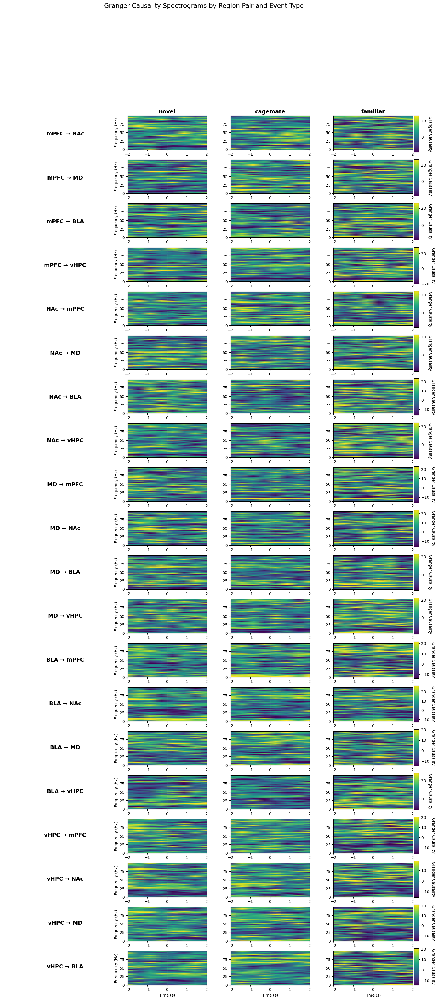

In [19]:
def plot_coherence_causality(lfp_collection, events, mode, event_len, baseline=None, pre_window=0, post_window=0, freq_range=(0,100)):
    """
    Plot coherence or Granger causality spectrograms for unique combinations of brain regions.
    
    Parameters:
    -----------
    lfp_collection : LFPCollection or LFPRecording
        Collection of LFP recordings or a single recording
    events : list
        List of event types to analyze
    mode : str
        Analysis mode
    event_len : float
        Duration of event in seconds
    measure_type : str
        Type of measure to plot ('coherence' or 'granger')
    baseline : str, optional
        Baseline event type for normalization
    pre_window : float, optional
        Time before event onset to include
    post_window : float, optional
        Time after event end to include
    freq_range : tuple, optional
        Range of frequencies to plot (min, max)
    """
    # Process collection vs single recording
    if isinstance(lfp_collection, LFPCollection):
        recordings = lfp_collection.lfp_recordings
    elif isinstance(lfp_collection, LFPRecording):
        recordings = [lfp_collection]
    else:
        raise TypeError("lfp_collection must be either LFPCollection or LFPRecording")
    
    # Dictionary to store the average event data for each event type
    event_averages_dict = {}
    
    # Process each event type
    for i in range(len(events)):
        all_events = []
        for recording in recordings:
            # Events shape: [trials, time, freq, regions, regions]
            recording_events = lfpa.__get_events__(recording, events[i], mode, event_len, 
                                                  pre_window, post_window, average=False)
            
            if baseline is not None:
                # TODO: edit this to work with not averages 
                adj_averages = lfpa.__baseline_diff__(
                    recording, recording_events, baseline[i], mode, event_len, 
                    pre_window=0, post_window=0, average = False
                )
                all_events.extend(adj_averages)
            else:
                all_events.extend(recording_events)
        
        # Calculate average across trials for this event type
        average_event = np.nanmean(np.array(all_events), axis=0)
        event_averages_dict[events[i]] = average_event
    
    # Get dimensions and axes from the first event
    first_event = list(event_averages_dict.values())[0]
    n_timepoints, n_freqs, n_regions, _ = first_event.shape
    time_axis = np.linspace(-pre_window, event_len+post_window, n_timepoints)
    freq_axis = range(freq_range[0], freq_range[1])
    
    # Get region names
    region_names = [f'{cups_collection.brain_region_dict.inverse[i]}' for i in range(n_regions)]
    
    # Generate region pairs based on measure type
    region_pairs = []
    region_pair_indices = []
    
    if mode == "coherence":
        # For coherence: unique pairs only (no self-pairs, only one direction)
        for i in range(n_regions):
            for j in range(i+1, n_regions):  # Start from i+1 to avoid self-pairs and duplicates
                region_pairs.append(f"{region_names[i]}_{region_names[j]}")
                region_pair_indices.append((i, j))
    else:  # Granger causality
        # For Granger: all directed pairs (no self-pairs, both directions)
        for i in range(n_regions):
            for j in range(n_regions):
                if i != j:  # Skip self-pairs
                    region_pairs.append(f"{region_names[i]} → {region_names[j]}")
                    region_pair_indices.append((i, j))
    
    n_pairs = len(region_pairs)
    
    # Calculate vmin and vmax per region pair across all events
    pair_bounds = []
    for pair_idx, (region_i, region_j) in enumerate(region_pair_indices):
        # Collect data for this region pair across all events
        pair_data = np.array([])
        for event_data in event_averages_dict.values():
            # Extract only the frequency range we want to display
            sliced_data = event_data[:, freq_range[0]:freq_range[1], region_i, region_j]
            if pair_data.size == 0:
                pair_data = sliced_data.flatten()
            else:
                pair_data = np.concatenate([pair_data, sliced_data.flatten()])
        
        # Calculate percentiles for this pair's data
        pair_vmin = np.percentile(pair_data, 5)
        pair_vmax = np.percentile(pair_data, 95)
        
        # Store bounds for this pair
        pair_bounds.append((pair_vmin, pair_vmax))
    
    # Setup figure layout - rows are region pairs, columns are event types
    n_rows = n_pairs
    n_cols = len(events)
    
    # Adjust figure size based on number of subplots
    fig_size = (15, 10)
    adjusted_width = max(fig_size[0], 4 * n_cols)
    adjusted_height = max(fig_size[1], 2 * n_rows)  # Increase height for more region pairs
    
    # Create figure with extra space for everything
    fig = plt.figure(figsize=(adjusted_width + 4, adjusted_height))
    
    # Create layout with extra space for labels and colorbars
    # Main gridspec for all content
    # For Granger causality we need more space for directional labels
    label_width_ratio = 0.3 if mode == "granger" else 0.25
    outer_gs = fig.add_gridspec(1, 2, width_ratios=[label_width_ratio, 1-label_width_ratio], wspace=0.0)
    
    # Left side for region pair labels
    labels_gs = outer_gs[0].subgridspec(n_rows, 1)
    
    # Right side for plots and colorbars
    right_gs = outer_gs[1].subgridspec(1, 2, width_ratios=[0.985, 0.015], wspace=0.01)
    
    # Further divide the plots area into a grid for each region pair and event
    plots_gs = right_gs[0].subgridspec(n_rows, n_cols, hspace=0.3, wspace=0.3)
    
    # And the colorbar area into a column for each region pair
    cbar_gs = right_gs[1].subgridspec(n_rows, 1)
    
    # Create axes
    label_axes = []
    plot_axes = []
    cbar_axes = []
    
    # Create label axes
    for row_idx in range(n_rows):
        label_ax = fig.add_subplot(labels_gs[row_idx, 0])
        label_ax.axis('off')  # Hide axis elements
        label_axes.append(label_ax)
    
    # Create plot axes
    for row_idx in range(n_rows):
        row_axes = []
        for col_idx in range(n_cols):
            ax = fig.add_subplot(plots_gs[row_idx, col_idx])
            row_axes.append(ax)
        plot_axes.append(row_axes)
    
    # Create colorbar axes
    for row_idx in range(n_rows):
        cbar_ax = fig.add_subplot(cbar_gs[row_idx, 0])
        cbar_axes.append(cbar_ax)
    
    # Add the region pair labels
    for row_idx, pair_name in enumerate(region_pairs):
        label_axes[row_idx].text(0.5, 0.5, pair_name,
                                 fontsize=14, fontweight='bold',
                                 rotation=0, ha='center', va='center',
                                 transform=label_axes[row_idx].transAxes)
    
    # Plot spectrograms and add colorbars
    for row_idx, (region_i, region_j) in enumerate(region_pair_indices):
        pair_vmin, pair_vmax = pair_bounds[row_idx]
        
        # Reference to store the last image for colorbar
        pair_im = None
        
        # Plot each event for this region pair
        for col_idx, event in enumerate(events):
            ax = plot_axes[row_idx][col_idx]
            
            # Get the event data for this specific region pair
            event_data = event_averages_dict[event][:, freq_range[0]:freq_range[1], region_i, region_j].T
            
            # Plot the spectrogram
            im = ax.pcolormesh(time_axis, freq_axis, event_data,
                              cmap='viridis', vmin=pair_vmin, vmax=pair_vmax, shading='gouraud')
            
            pair_im = im  # Save for colorbar
            
            # Add vertical line at t=0 (event onset)
            ax.axvline(x=0, color='white', linestyle='--', alpha=0.7)
            
            # Set labels only on left and bottom edges
            if col_idx == 0:
                ax.set_ylabel('Frequency (Hz)')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)')
            
            # Add event type title
            if row_idx == 0:
                ax.set_title(f"{event}", fontsize=14, fontweight='bold')
        
        # Add colorbar for this region pair
        if pair_im is not None:
            cbar = plt.colorbar(pair_im, cax=cbar_axes[row_idx])
            measure_label = "Coherence" if mode == "coherence" else "Granger Causality"
            cbar.set_label(measure_label, rotation=270, labelpad=15)
    
    # Add overall title
    measure_title = "Coherence" if mode == "coherence" else "Granger Causality"
    fig.suptitle(f'{measure_title} Spectrograms by Region Pair and Event Type', fontsize=16, y=0.98)
    
plot_coherence_causality(cups_collection,events = ['novel', 'cagemate', 'familiar'], baseline = ['novel_baseline', 'cagemate_baseline','familiar_baseline'], mode = 'granger', event_len = 2, pre_window = 2, freq_range = (0, 100))

In [20]:
from collections import defaultdict
def diff_band_calcs(values, freq_range_dict):
    agent_band_dict = {}
    for agent, calculations in values.items():
        agent_band_dict[agent] = {}
        for name, freq_range in freq_range_dict.items():
            calculations = np.array(calculations)
            # calculations = [trials, frequencies, brain regions]
            temp = np.nanmean(calculations[:, freq_range[0]:freq_range[1], ...], axis=1)
            agent_band_dict[agent][name] = temp

    band_agent_dict = defaultdict(dict)
    for agent, bands in agent_band_dict.items():
        for band, values in bands.items():
            band_agent_dict[band][agent] = values

    return [agent_band_dict, band_agent_dict]

In [21]:

def plot_averages(power_dict, lfp_collection,colors, bar_width = None, freq_range_dict = None):
    # Get the single event (assuming one event in all conditions)
    first_condition = list(power_dict.keys())[0]
    #event = list(power_dict[first_condition].keys())[0]
   
    # Process data for each condition
    condition_data = {}
    for condition, powers in power_dict.items():
        if freq_range_dict is None:
            [unflipped, flipped] = lfpa.band_calcs(powers)
        else:
             [unflipped, flipped] = diff_band_calcs(powers, freq_range_dict)
        brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
        for i in range(len(lfp_collection.brain_region_dict.keys())):
            brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
            
        avg_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
        sem_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
    
        event = list(unflipped.keys())[0]
        
        for key in flipped.keys():
            for i, subset in enumerate(brain_regions):
                avg_values[key][subset] = np.nanmean(flipped[key][event][:, i])
                sem_values[key][subset] = stats.sem(flipped[key][event][:, i], nan_policy="omit")
                    
        condition_data[condition] = {'avg': avg_values, 'sem': sem_values}
    
    # Plotting
    # Calculate number of subplots needed (one per frequency band)
    freq_bands = list(flipped.keys())
    n_bands = len(freq_bands)
    n_rows = (n_bands + 1) // 2  # 2 plots per row, rounded up
    
    
   
    
    # Plotting parameters
    if bar_width is None:
        bar_width = 0.35
    conditions = list(power_dict.keys())
    fig, axs = plt.subplots(n_rows, 2, figsize=(7.5*len(conditions), 5*n_rows))
    fig.suptitle(f"Average Power by Frequency Band", fontsize=24, y = 1.1)
    axs = axs.ravel()  # Flatten axes array for easier indexing
    for i, band in enumerate(freq_bands):
        ax = axs[i]
        x = np.arange(len(brain_regions))
        
        for j, condition in enumerate(conditions):
            positions = x + (j - len(conditions)/2 + 0.5) * bar_width
            ax.bar(positions,
                  [condition_data[condition]['avg'][band][region] for region in brain_regions],
                  width=bar_width,
                  yerr=[condition_data[condition]['sem'][band][region] for region in brain_regions],
                  capsize=5,
                  linewidth=2,
                  error_kw={"elinewidth": 2, "capthick": 2},
                  label=condition,
                  color=colors[j],
                  edgecolor = 'black')  # Add hatching for second condition
        
        ax.set_title(band, fontsize=20)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['left'].set_linewidth(2)
        ax.axhline(y=0, color="black", linestyle="--", alpha=0.8)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_xticks(x+.25)
        ax.set_xticklabels(brain_regions, rotation=0, ha='right', fontsize = 18)
        ax.set_ylabel('Power', fontsize = 18)
        #if i == 0:  # Add legend to first subplot
        ax.legend(fontsize=14, frameon=False, bbox_to_anchor = (1,1))
        ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
        ax.yaxis.get_offset_text().set_fontsize(14) 
    # Remove empty subplots
    for i in range(len(freq_bands), len(axs)):
        fig.delaxes(axs[i])
        
    plt.tight_layout()
    plt.show()


def plot_coherence_bar(coherence_dict, lfp_collection, colors, bar_width = None):
    # Get the single event (assuming one event in all conditions)
    first_condition = list(coherence_dict.keys())[0]
    event = list(coherence_dict[first_condition].keys())[0]
    
    # Get brain region pairs
    region_dict = lfp_collection.brain_region_dict
    brain_regions = list(combinations(list((region_dict.keys())), 2))
    
    # Process data for each condition
    condition_data = {}
    for condition, coherences in coherence_dict.items():
        [unflipped, flipped] = lfpa.band_calcs(coherences)
        
        avg_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
        sem_values = {key: {subset: [] for subset in brain_regions} for key in flipped.keys()}
        event = list(unflipped.keys())[0]
        
        for key in flipped.keys():
            for i, subset in enumerate(brain_regions):
                pair_index_1 = region_dict[brain_regions[i][0]]
                pair_index_2 = region_dict[brain_regions[i][1]]
                avg_values[key][subset] = np.nanmean(flipped[key][event][:, pair_index_1, pair_index_2])
                sem_values[key][subset] = stats.sem(
                    flipped[key][event][:, pair_index_1, pair_index_2], 
                    nan_policy="omit"
                )
                    
        condition_data[condition] = {'avg': avg_values, 'sem': sem_values}
    
    # Plotting
    # Calculate number of subplots needed (one per frequency band)
    freq_bands = list(flipped.keys())
    n_bands = len(freq_bands)
    n_rows = (n_bands + 1) // 2  # 2 plots per row, rounded up
    conditions = list(coherence_dict.keys())
    fig, axs = plt.subplots(n_rows, 2, figsize=(10*len(conditions), 5*n_rows))
    fig.suptitle(f"Average Coherence by Frequency Band", fontsize=24, y =1.05)
    axs = axs.ravel()  # Flatten axes array for easier indexing
    
    # Plotting parameters
    if bar_width is None:
        bar_width = 0.35
    
    
    for i, band in enumerate(freq_bands):
        ax = axs[i]
        x = np.arange(len(brain_regions))
        
        for j, condition in enumerate(conditions):
            positions = x + (j - len(conditions)/2 + 0.5) * bar_width
            ax.bar(positions,
                  [condition_data[condition]['avg'][band][region] for region in brain_regions],
                  width=bar_width,
                  yerr=[condition_data[condition]['sem'][band][region] for region in brain_regions],
                  capsize=5,
                  linewidth=2,
                  error_kw={"elinewidth": 2, "capthick": 2},
                  label=condition,
                  color=colors[j],
                  edgecolor = 'black')  # Add hatching for second condition
        
        ax.set_title(band, fontsize=20, y = 1.1)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_linewidth(2)
        ax.spines['left'].set_linewidth(2)
        ax.axhline(y=0, color="black", linestyle="--", alpha=0.8)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_xticks(x)
        # Format brain region pair labels
        region_labels = [f"{pair[0]}-{pair[1]}" for pair in brain_regions]
        ax.set_xticklabels(region_labels, rotation=45, ha='right')
        
        #if i == 0:  # Add legend to first subplot
        ax.legend(fontsize=14, frameon=False, bbox_to_anchor=(1,1))
            
        ax.set_ylabel("Coherence", fontsize = 18)
        #ax.set_ylim(.3,1)
    # Remove empty subplots
    for i in range(len(freq_bands), len(axs)):
        fig.delaxes(axs[i])
        
    plt.tight_layout()
    plt.show()

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:31, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:460: RuntimeWarning: Mean of empty slice
  low_gamma = np.nanmean(calculati

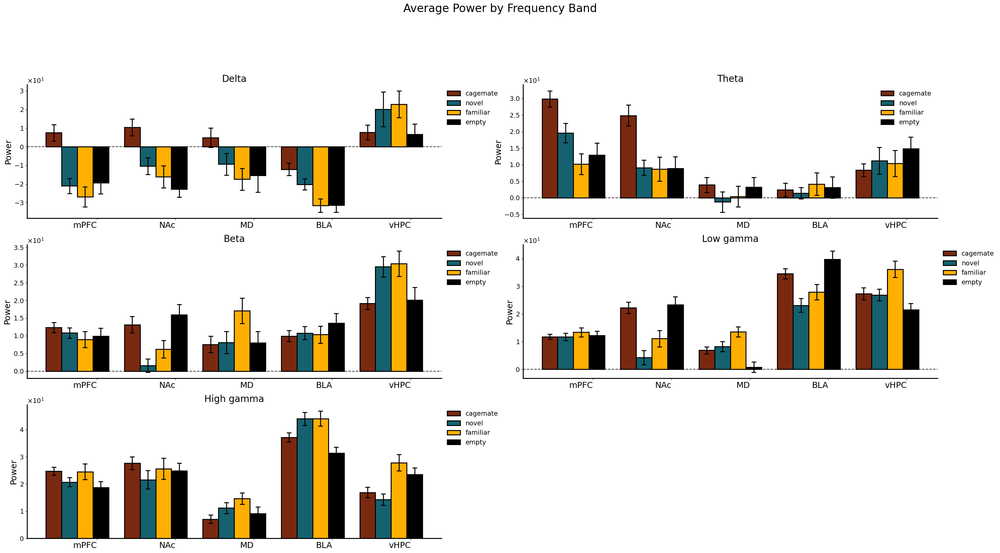

/scratch/local/65741798/ipykernel_3481685/371384620.py:9: RuntimeWarning: Mean of empty slice
  temp = np.nanmean(calculations[:, freq_range[0]:freq_range[1], ...], axis=1)


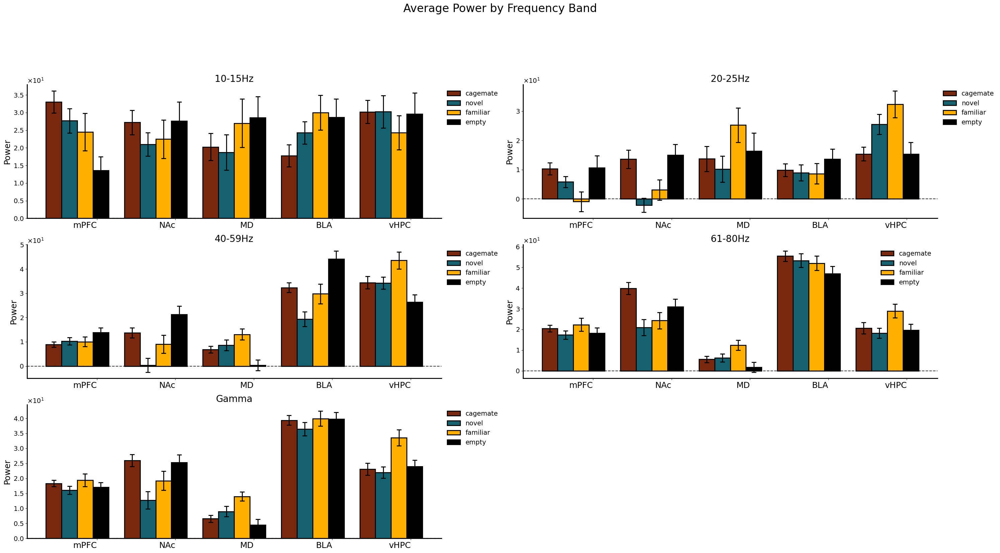

In [22]:
novel_power_averages = lfpa.average_events(cups_collection, events = ['novel'], baseline = 'novel_baseline', mode = 'power', plot = False)
cagemate_power_averages = lfpa.average_events(cups_collection, events = ['cagemate'], baseline = 'cagemate_baseline', mode = 'power', plot = False)
familiar_power_averages = lfpa.average_events(cups_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'power', plot = False)
empty_power_averages = lfpa.average_events(cups_collection, events = ['empty'], baseline = 'empty_baseline', mode = 'power', plot = False)
power_dict = {'cagemate':cagemate_power_averages,
              'novel': novel_power_averages, 
              'familiar': familiar_power_averages,
              'empty':empty_power_averages}

colors = ['#792910', '#15616F', (1.0, 0.6862745098039216, 0.0), 'black']
plot_averages(power_dict, cups_collection, colors = colors, bar_width = .2)
plot_averages(power_dict, cups_collection, colors = colors, bar_width = 0.2,  freq_range_dict = {'10-15Hz': (10,15),
                                                                                                 '20-25Hz': (20,25),
                                                                                                 '40-59Hz': (40,59),
                                                                                                 '61-80Hz':(61,80),
                                                                                                'Gamma':(40,100) })

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:

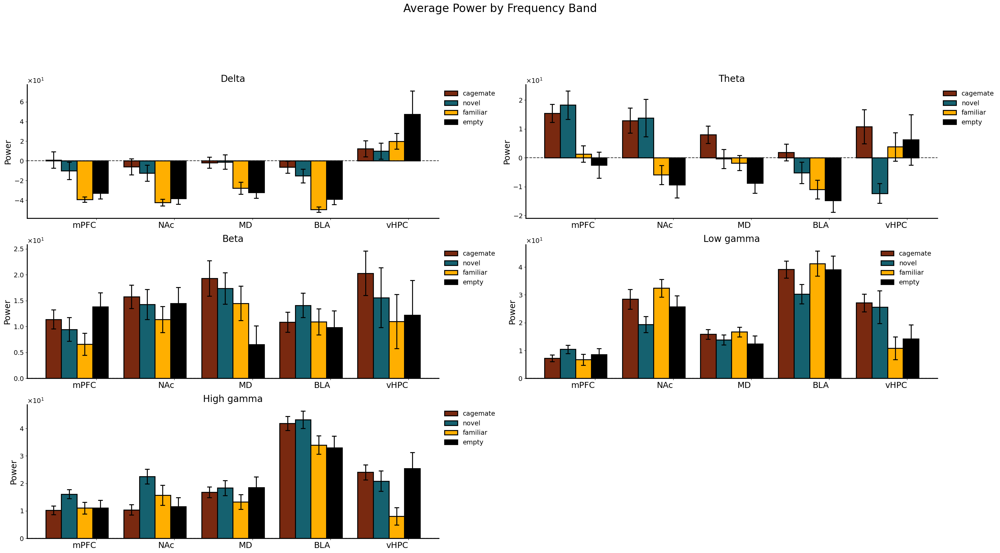

In [23]:
cups2_collection.brain_region_dict = cups2_collection.lfp_recordings[0].brain_region_dict

novel_power_averages = lfpa.average_events(cups2_collection, events = ['novel'], baseline = 'novel_baseline', mode = 'power', plot = False)
cagemate_power_averages = lfpa.average_events(cups2_collection, events = ['cagemate'], baseline = 'cagemate_baseline', mode = 'power', plot = False)
familiar_power_averages = lfpa.average_events(cups2_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'power', plot = False)
empty_power_averages = lfpa.average_events(cups2_collection, events = ['empty'], baseline = 'empty_baseline', mode = 'power', plot = False)
power_dict = {'cagemate':cagemate_power_averages,
              'novel': novel_power_averages, 
              'familiar': familiar_power_averages,
              'empty':empty_power_averages}

colors = ['#792910', '#15616F', (1.0, 0.6862745098039216, 0.0), 'black']
plot_averages(power_dict, cups2_collection, colors = colors, bar_width = .2)
#plot_averages(power_dict, cups2_collection, colors = colors, bar_width = 0.2,  freq_range_dict = {'10-15Hz': (10,15),
                                                                                                 # '20-25Hz': (20,25),
                                                                                                 # '40-59Hz': (40,59),
                                                                                                 # '61-80Hz':(61,80)})

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:

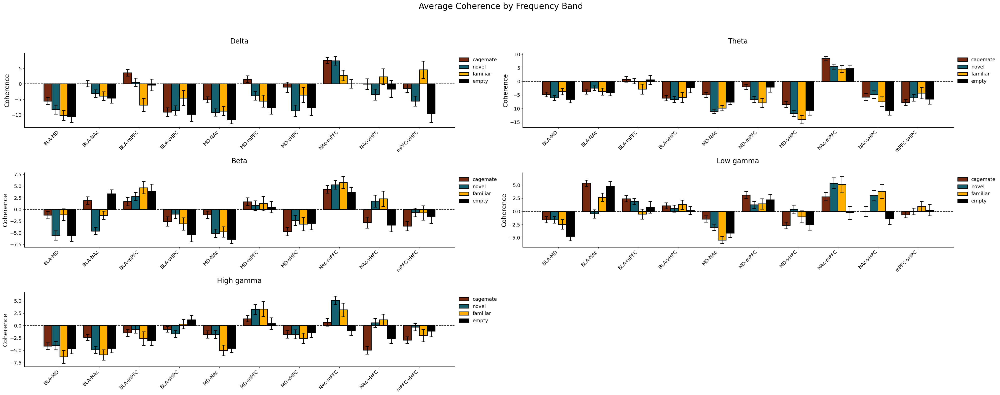

In [24]:
novel_coherence_averages = lfpa.average_events(cups_collection, events = ['novel'], baseline = 'novel_baseline', mode = 'coherence', plot = False)
cagemate_coherence_averages = lfpa.average_events(cups_collection, events = ['cagemate'], baseline = 'cagemate_baseline', mode = 'coherence', plot = False)
familiar_coherence_averages = lfpa.average_events(cups_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)
empty_coherence_averages = lfpa.average_events(cups_collection, events = ['empty'], baseline = 'empty_baseline', mode = 'coherence', plot = False)
coherence_dict = {'cagemate':cagemate_coherence_averages,
              'novel': novel_coherence_averages, 
              'familiar': familiar_coherence_averages,
              'empty':empty_coherence_averages}

colors = ['#792910', '#15616F', (1.0, 0.6862745098039216, 0.0), 'black']
plot_coherence_bar(coherence_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:

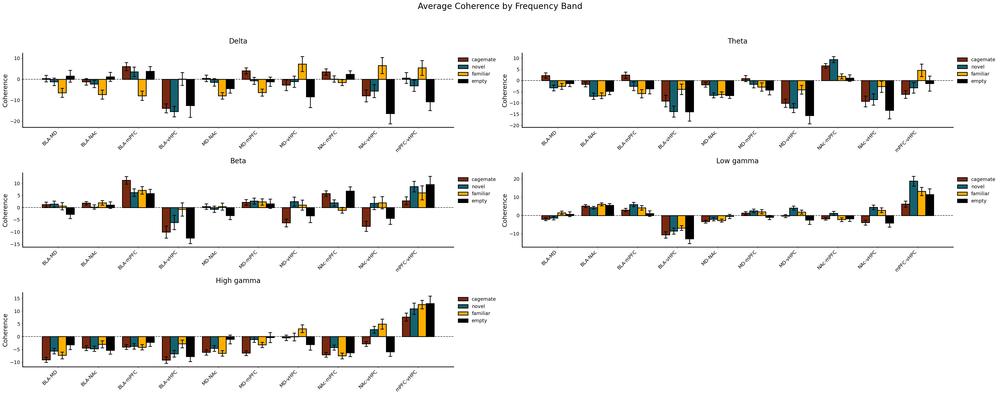

In [25]:
novel_coherence_averages = lfpa.average_events(cups2_collection, events = ['novel'], baseline = 'novel_baseline', mode = 'coherence', plot = False)
cagemate_coherence_averages = lfpa.average_events(cups2_collection, events = ['cagemate'], baseline = 'cagemate_baseline', mode = 'coherence', plot = False)
familiar_coherence_averages = lfpa.average_events(cups2_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)
empty_coherence_averages = lfpa.average_events(cups2_collection, events = ['empty'], baseline = 'empty_baseline', mode = 'coherence', plot = False)
coherence_dict = {'cagemate':cagemate_coherence_averages,
              'novel': novel_coherence_averages, 
              'familiar': familiar_coherence_averages,
              'empty':empty_coherence_averages}

colors = ['#792910', '#15616F', (1.0, 0.6862745098039216, 0.0), 'black']
plot_coherence_bar(coherence_dict, cups2_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:

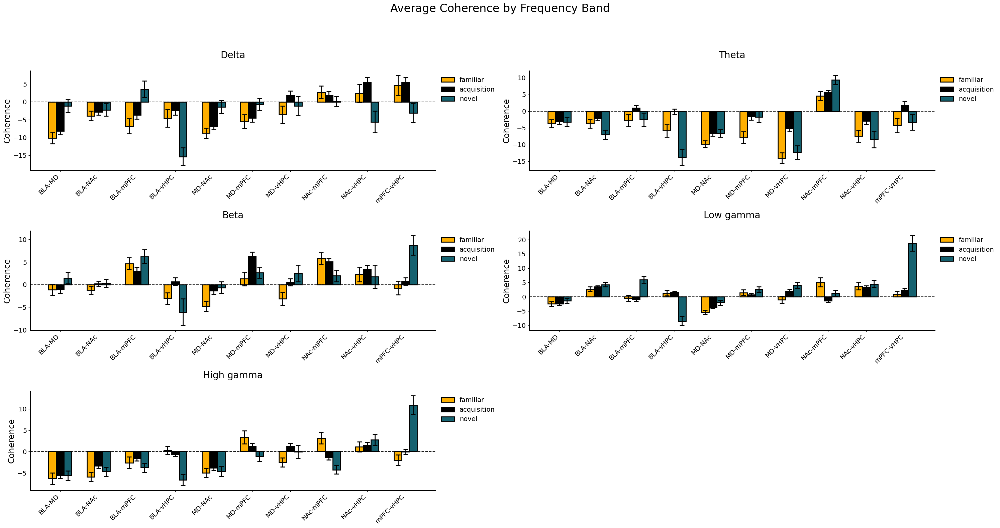

In [26]:
familiar_coherence_averages = lfpa.average_events(cups_collection, events = ['familiar'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)
acquisition_coherence_averages = lfpa.average_events(cups_collection, events = ['acquisition'], baseline = 'familiar_baseline', mode = 'coherence', plot = False)

acq_fam_dict = {'familiar': familiar_coherence_averages,
              'acquisition':acquisition_coherence_averages,
               'novel': novel_coherence_averages}

colors = [(1.0, 0.6862745098039216, 0.0),'black','#15616F']
plot_coherence_bar(acq_fam_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:

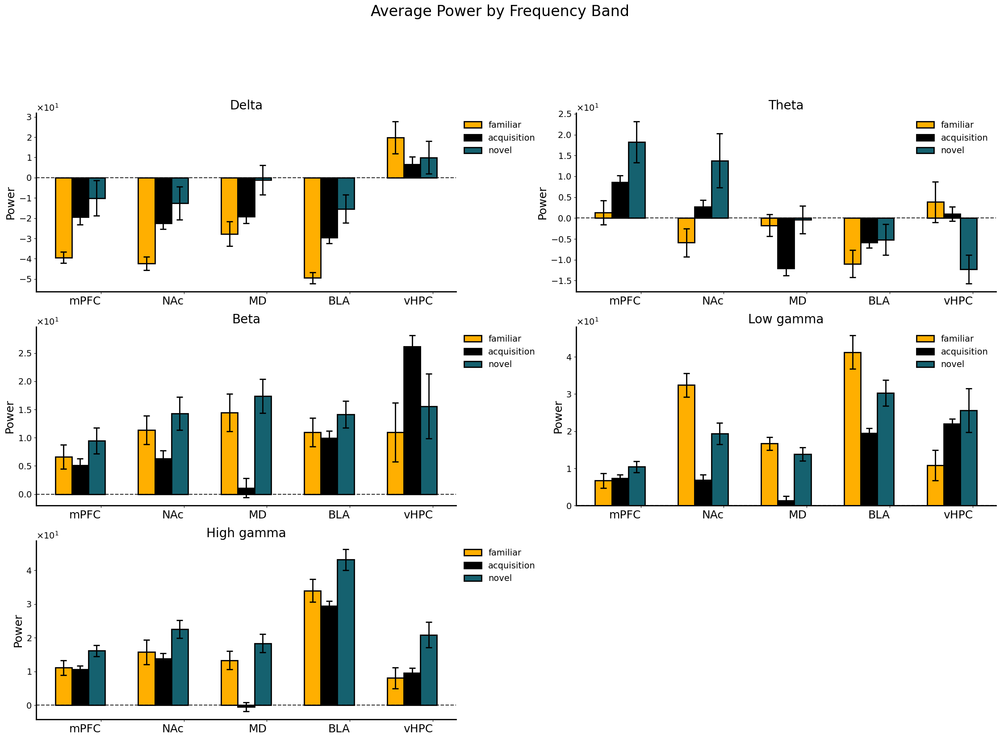

In [27]:
acquisition_power_averages = lfpa.average_events(cups_collection, events = ['acquisition'], baseline = 'familiar_baseline', mode = 'power', plot = False)

acq_fam_dict = {'familiar': familiar_power_averages,
              'acquisition':acquisition_power_averages,
               'novel': novel_power_averages}

colors = [(1.0, 0.6862745098039216, 0.0),'black','#15616F']
plot_averages(acq_fam_dict, cups_collection, colors = colors, bar_width = .2)

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


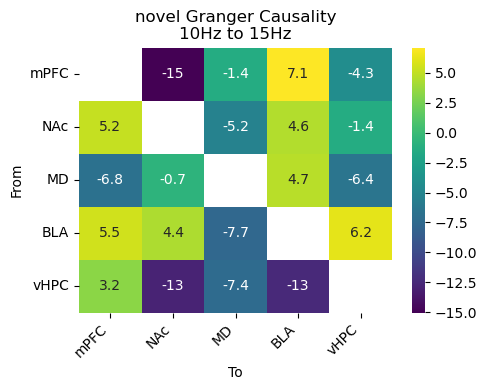

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


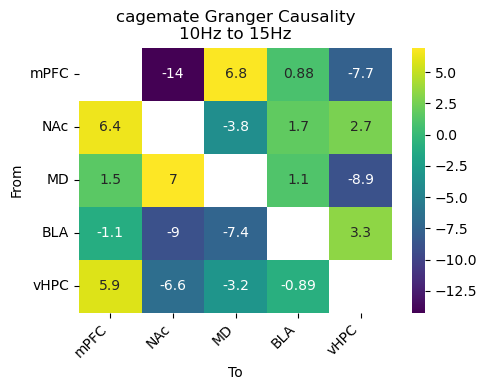

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


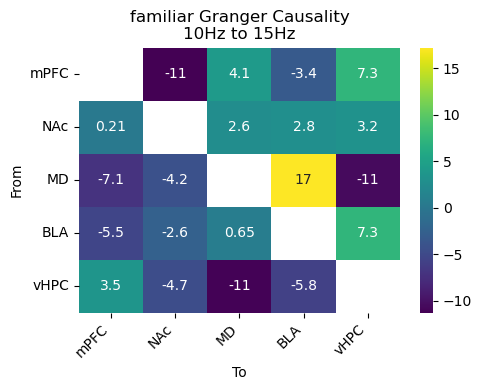

In [28]:
lfpa.plot_granger_heatmap(cups_collection, events =['novel'], baseline = 'novel_baseline', freq = (10,15))
lfpa.plot_granger_heatmap(cups_collection, events =['cagemate'], baseline='cagemate_baseline', freq = (10,15))
lfpa.plot_granger_heatmap(cups_collection, events =['familiar'], baseline='familiar_baseline', freq = (10,15))


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


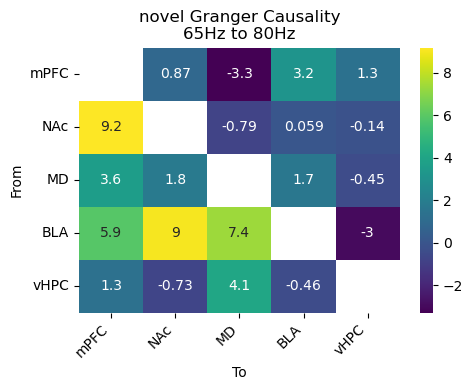

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


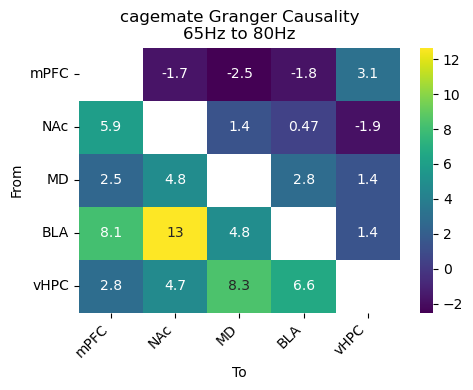

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


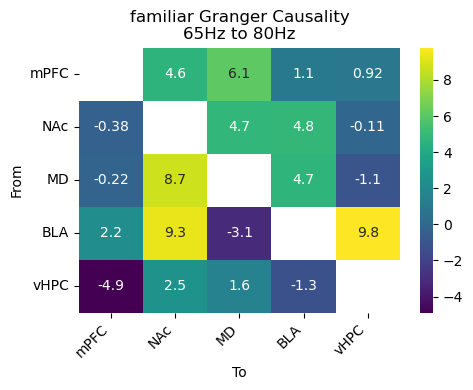

In [29]:
lfpa.plot_granger_heatmap(cups_collection, events =['novel'], baseline = 'novel_baseline', freq = (65,80))
lfpa.plot_granger_heatmap(cups_collection, events =['cagemate'], baseline='cagemate_baseline', freq = (65,80))
lfpa.plot_granger_heatmap(cups_collection, events =['familiar'], baseline='familiar_baseline', freq = (65,80))


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


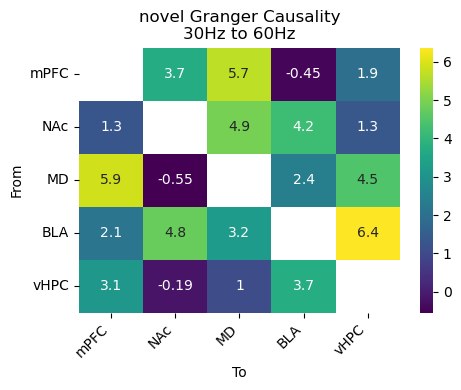

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


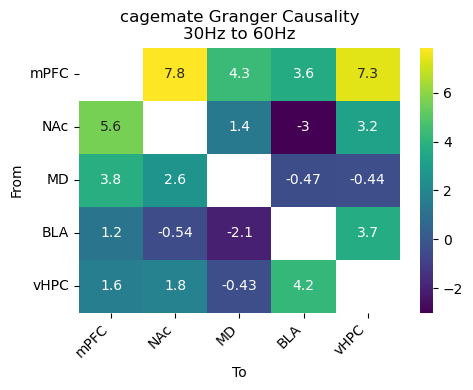

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:269: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:271: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


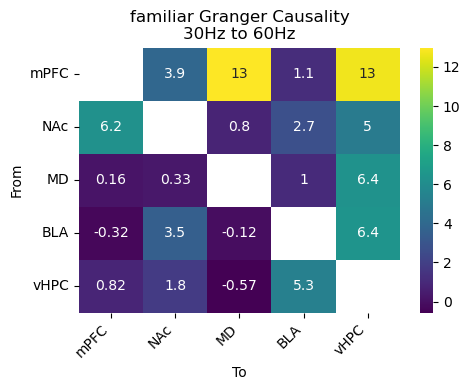

In [30]:
lfpa.plot_granger_heatmap(cups_collection, events =['novel'], baseline = 'novel_baseline', freq = (30,60))
lfpa.plot_granger_heatmap(cups_collection, events =['cagemate'], baseline='cagemate_baseline', freq = (30,60))
lfpa.plot_granger_heatmap(cups_collection, events =['familiar'], baseline='familiar_baseline', freq = (30,60))


In [50]:
def plot_heatmap(lfp_collection, events, freq, color, vmax, baseline= None, event_len = None, mode = 'granger'):
    event_grangers = lfpa.average_events(lfp_collection, events, mode=mode, baseline=baseline, event_len=event_len, plot=False)
    n_events = len(events)
    n_cols = min(3, n_events)  # Max 3 columns
    n_rows = (n_events + n_cols - 1) // n_cols  # Ceiling division
    # Create figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
    if n_events == 1:
        axes = np.array([axes])  # Make single axis iterable
    axes = axes.flatten()  # Flatten for easy iteration
    # Get brain regions once since they're the same for all plots
    brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
    for i in range(len(lfp_collection.brain_region_dict.keys())):
        brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
    for idx, (event, ax) in enumerate(zip(events, axes)):
        event_granger = event_grangers[event]
        avg_granger = np.nanmean(event_granger, axis=0)
        freq_granger = avg_granger[freq[0] : freq[1], :, :]
        avg_freq = np.nanmean(freq_granger, axis=0)
        cmap = LinearSegmentedColormap.from_list('custom', color, N=100)
        sns.heatmap(avg_freq, xticklabels=brain_regions, yticklabels=brain_regions, annot=True, cmap=cmap, ax=ax, vmax = vmax)
        ax.set_title(f"{event} Granger Causality\n{freq[0]}Hz to {freq[1]}Hz")
        # Rotate labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_ylabel("From")
        ax.set_xlabel("To")
    # Remove any empty subplots
    for idx in range(len(events), len(axes)):
        fig.delaxes(axes[idx])
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/1768522163.py:17: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/1768522163.py:19: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


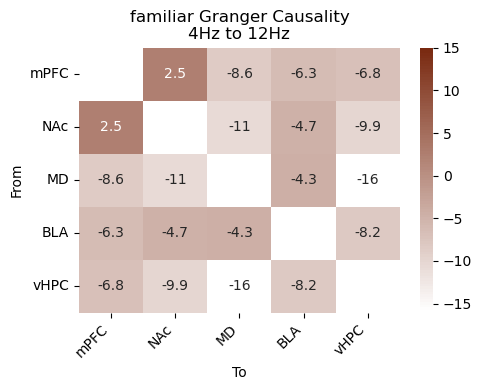

In [51]:
plot_heatmap(cups_collection, events =['familiar'], baseline = 'familiar_baseline', freq = (4,12), color = ['white','#792910'] , vmax = 15, mode = 'coherence')

In [52]:
def plot_heatmap(lfp_collection, events, freq, color, vmax=None, vmin = None, baselines=None, event_len=None,mode = 'granger'):
    """
    Plot Granger causality heatmaps for multiple events as subplots with a shared colorbar per row.
    
    Parameters:
    -----------
    lfp_collection : LFP collection object
    events : list of strings, event names to plot
    freq : tuple, frequency range (min_freq, max_freq)
    color : list of two colors for colormap gradient
    vmax : float, maximum value for colorbar (applied to all plots)
    baselines : optional, list of baseline events corresponding to each event or single baseline for all
    event_len : optional, event length to analyze
    """
    from matplotlib.gridspec import GridSpec
    import numpy as np
    
    # Handle baselines parameter
    if baselines is None:
        # No baselines specified, use None for all events
        event_baselines = [None] * len(events)
    elif isinstance(baselines, list) and len(baselines) == len(events):
        # List of baselines matching events
        event_baselines = baselines
    else:
        # Single baseline for all events
        event_baselines = [baselines] * len(events)
    
    # Calculate Granger causality for each event with its corresponding baseline
    event_grangers = {}
    for event, baseline in zip(events, event_baselines):
        event_data = lfpa.average_events(
            lfp_collection, [event], mode=mode, 
            baseline=baseline, event_len=event_len, plot=False
        )
        event_grangers[event] = event_data[event]
    
    n_events = len(events)
    n_cols = min(3, n_events)  # Max 3 columns
    n_rows = (n_events + n_cols - 1) // n_cols  # Ceiling division
    
    # Create custom grid to accommodate colorbars
    fig = plt.figure(figsize=(5 * n_cols + 0.5, 4 * n_rows))
    gs = GridSpec(n_rows, n_cols + 1, width_ratios=[1] * n_cols + [0.05])
    
    # Get brain regions once since they're the same for all plots
    brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
    for i in range(len(lfp_collection.brain_region_dict.keys())):
        brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
    
    # Create custom colormap
    cmap = LinearSegmentedColormap.from_list('custom', color, N=100)
    
    # Calculate global vmax if not provided
    if vmax is None:
        all_values = []
        for event in events:
            event_granger = event_grangers[event]
            avg_granger = np.nanmean(event_granger, axis=0)
            freq_granger = avg_granger[freq[0]:freq[1], :, :]
            avg_freq = np.nanmean(freq_granger, axis=0)
            all_values.append(np.nanmax(avg_freq))
        vmax = np.max(all_values)
    if vmin is None:
        all_values = []
        for event in events:
            event_granger = event_grangers[event]
            avg_granger = np.nanmean(event_granger, axis=0)
            freq_granger = avg_granger[freq[0]:freq[1], :, :]
            avg_freq = np.nanmean(freq_granger, axis=0)
            all_values.append(np.nanmin(avg_freq))
        vmin = np.min(all_values)
    # Get all data matrices for consistent color scaling
    data_matrices = []
    for event in events:
        event_granger = event_grangers[event]
        avg_granger = np.nanmean(event_granger, axis=0)
        freq_granger = avg_granger[freq[0]:freq[1], :, :]
        avg_freq = np.nanmean(freq_granger, axis=0)
        data_matrices.append(avg_freq)
    
    # Plot each event
    axes = []
    for idx, event in enumerate(events):
        row = idx // n_cols
        col = idx % n_cols
        
        # Create subplot
        ax = fig.add_subplot(gs[row, col])
        axes.append(ax)
        
        # Get data
        avg_freq = data_matrices[idx]
        
        # Create heatmap without colorbar
        sns.heatmap(avg_freq, xticklabels=brain_regions, yticklabels=brain_regions,
                   annot=True, cmap=cmap, ax=ax, vmax=vmax, vmin=vmin, cbar=False)
        
        # Add baseline information to title if available
        baseline_info = ""
        if event_baselines[idx] is not None:
            baseline_info = f"\nBaseline: {event_baselines[idx]}"
            
        ax.set_title(f"{event} Granger Causality\n{freq[0]}Hz to {freq[1]}Hz{baseline_info}")
        
        # Rotate labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
        ax.set_ylabel("From")
        ax.set_xlabel("To")
        
        # Add colorbar at the end of each row
        if col == n_cols - 1 or idx == len(events) - 1:
            cbar_ax = fig.add_subplot(gs[row, -1])
            plt.colorbar(ax.collections[0], cax=cbar_ax)
    
    # Add overall title
    plt.suptitle(f"Granger Causality Analysis ({freq[0]}-{freq[1]}Hz)", 
                fontsize=16, y=1.02)
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
   

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


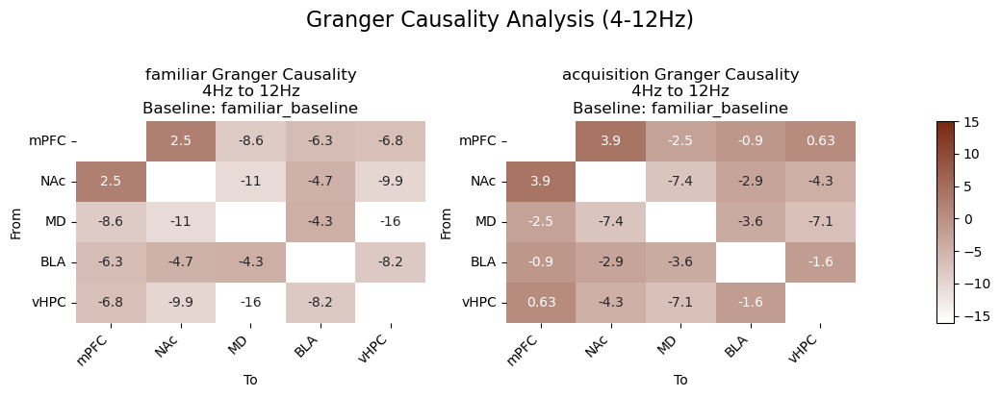

In [53]:
plot_heatmap(cups_collection, events =['familiar', 'acquisition'], baselines = 'familiar_baseline', freq = (4,12), color = ['white','#792910'] , vmax = 15, mode = 'coherence')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


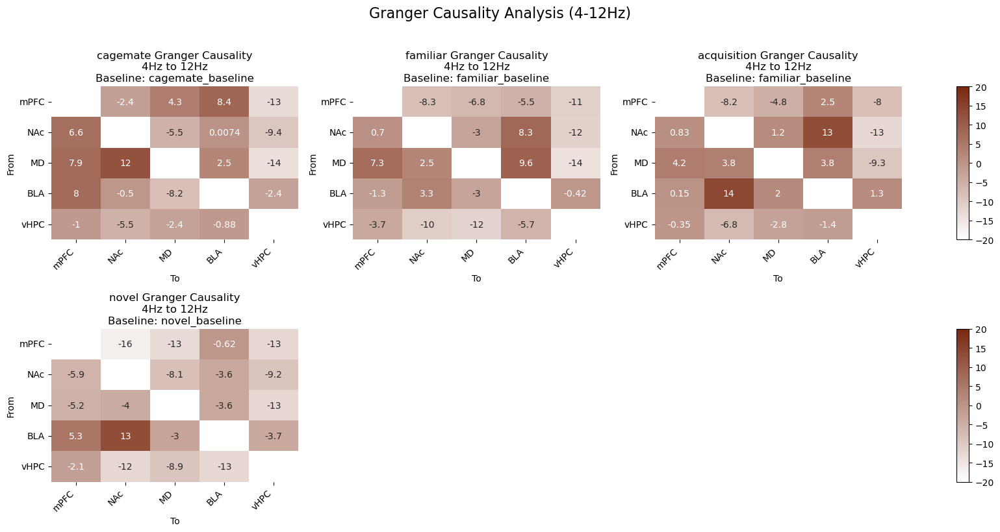

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


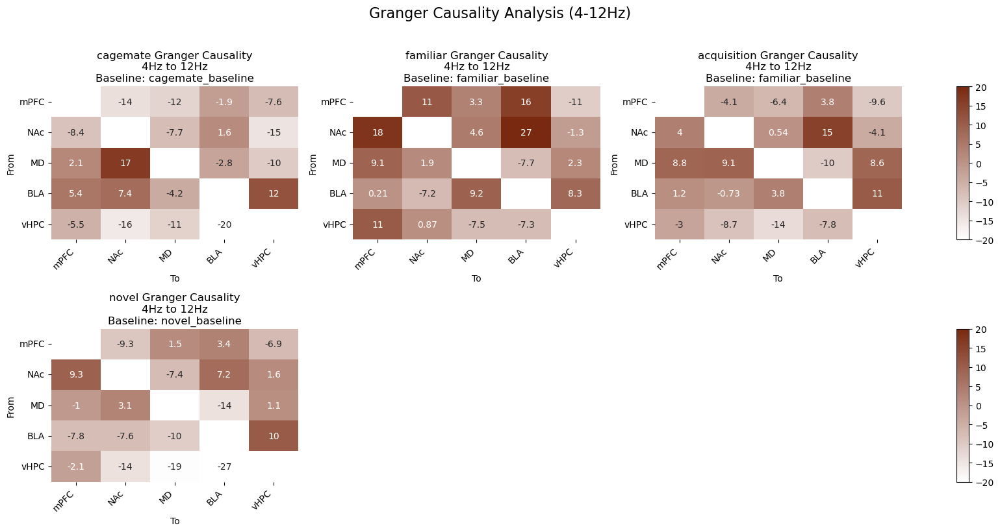

In [60]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (4,12), color = ['white','#792910'] , vmax = 20, vmin = -20, mode = 'granger')
plot_heatmap(cups2_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (4,12), color = ['white','#792910'] , vmax = 20, vmin = -20, mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


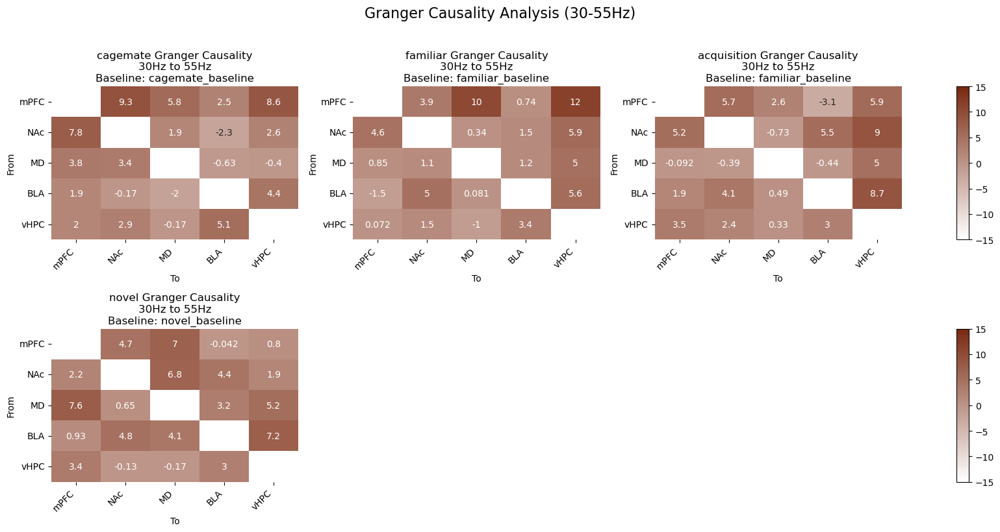

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


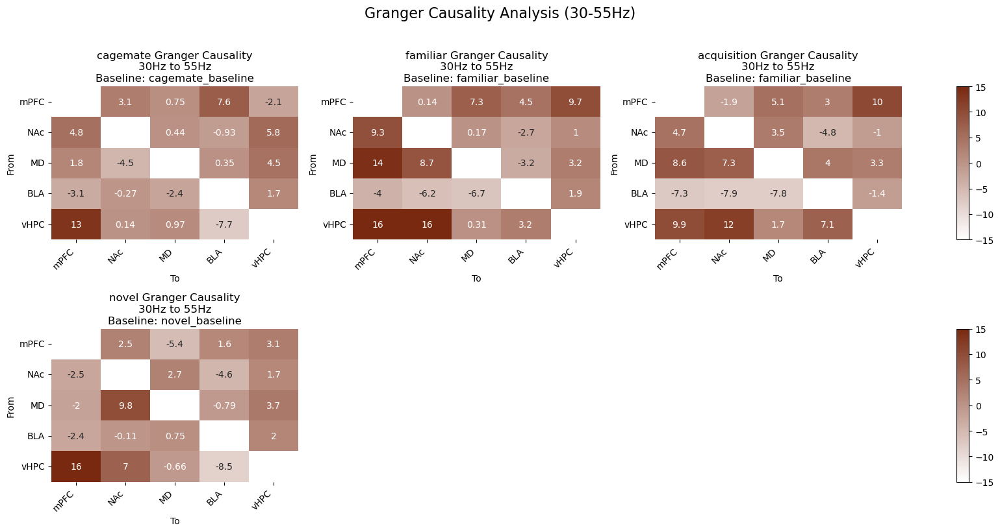

In [61]:
plot_heatmap(cups_collection, events=['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (30,55), color = ['white','#792910'] , vmax = 15, vmin = -15, mode = 'granger')
plot_heatmap(cups2_collection, events=['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (30,55), color = ['white','#792910'] , vmax = 15, vmin = -15, mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


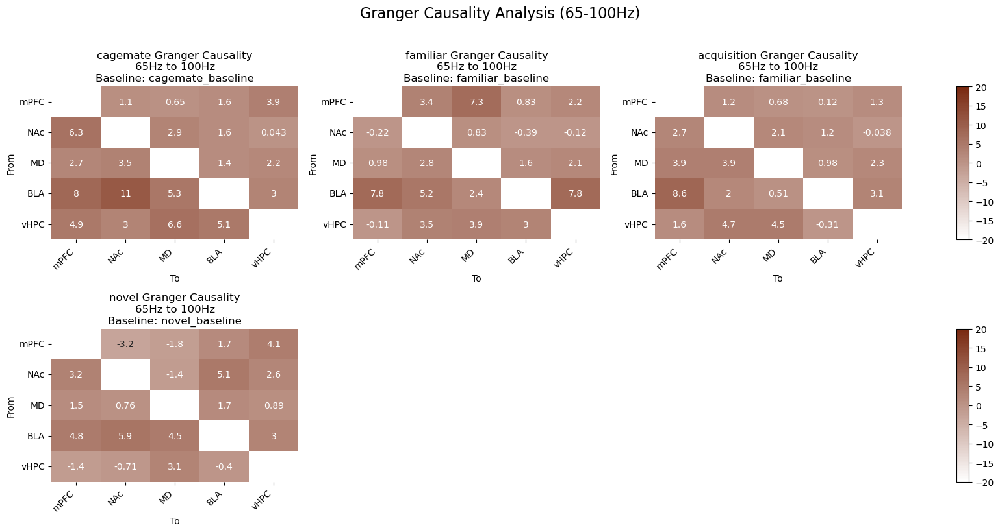

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:77: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:79: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)


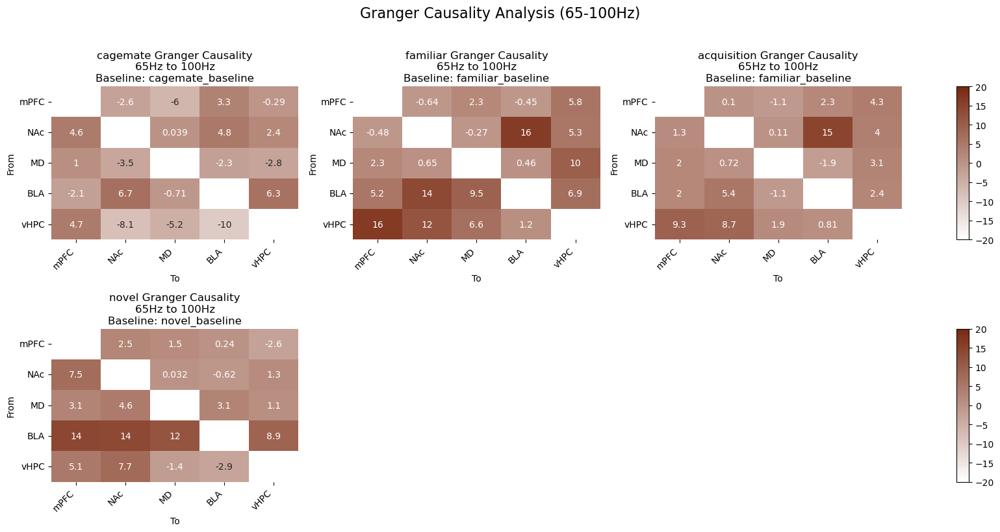

In [62]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (65,100), color = ['white','#792910'] , vmax = 20, vmin = -20, mode = 'granger')
plot_heatmap(cups2_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (65,100), color = ['white','#792910'] , vmax = 20, vmin = -20, mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:59: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:61: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/

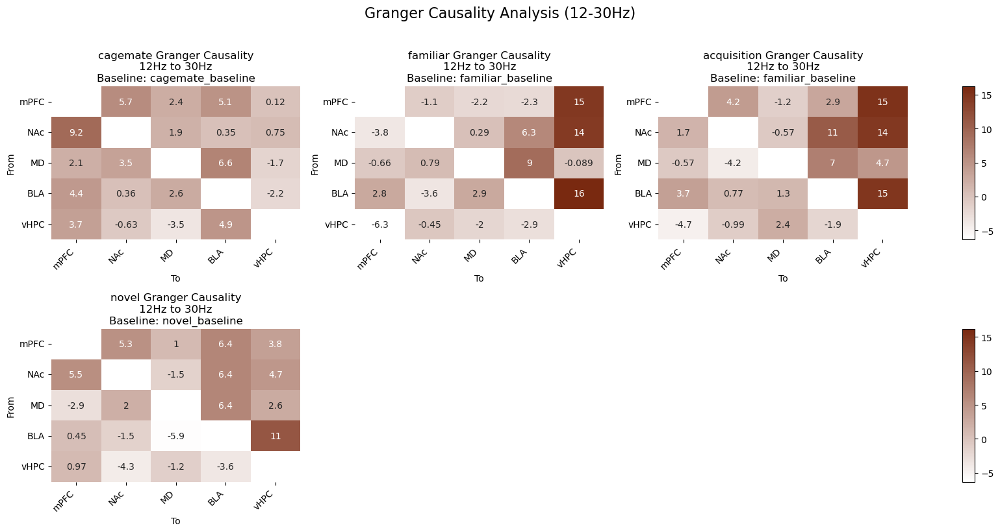

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:59: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:61: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/

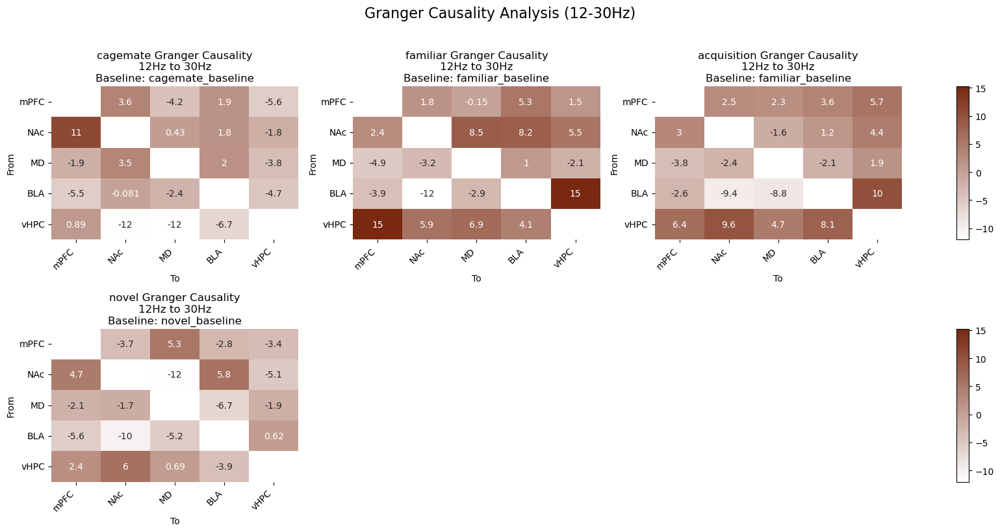

In [63]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (12,30), color = ['white','#792910'] , mode = 'granger')
plot_heatmap(cups2_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (12,30), color = ['white','#792910'] , mode = 'granger')

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:59: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:61: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:68: RuntimeWarning: Mean of empty slice
  avg_granger = np.nanmean(event_granger, axis=0)
/scratch/local/65741798/ipykernel_3481685/904676634.py:70: RuntimeWarning: Mean of empty slice
  avg_freq = np.nanmean(freq_granger, axis=0)
/scratch/local/

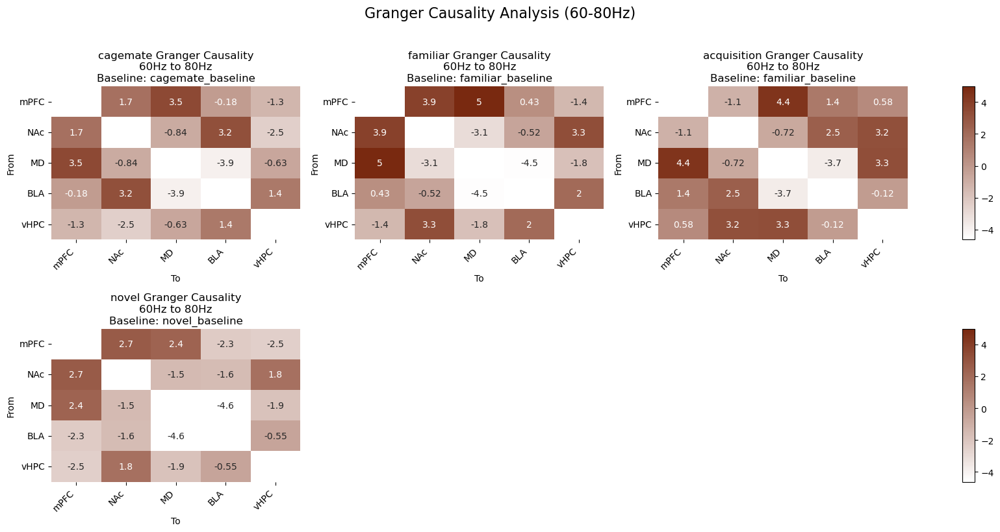

In [58]:
plot_heatmap(cups_collection, events =['cagemate','familiar', 'acquisition', 'novel'],
             baselines = ['cagemate_baseline','familiar_baseline', 'familiar_baseline', 'novel_baseline'],
             freq = (60,80), color = ['white','#792910'] , mode = 'coherence')

In [59]:
from importlib import reload
import itertools
reload(lfpa)
regions_bidict = cups_collection.brain_region_dict
averages = {}
events = ['cagemate','novel', 'familiar']
          
for recording in cups_collection.lfp_recordings: 
    averages[recording.subject] ={}
    for mode in ['power', 'coherence', 'granger']:
        regions = list(regions_bidict.keys())
        event_avg_dict = lfpa.average_events(recording, events = events, mode = mode)
        agent_band_dict, band_agent_dict = lfpa.band_calcs(event_avg_dict)
        for event, bands in agent_band_dict.items():
            for band in bands.keys():
                band_average = np.nanmean(bands[band], axis = 0)
                if mode == 'power':
                    for brain in regions:
                        reg_idx = cups_collection.brain_region_dict[brain]
                        averages[recording.subject][f"{event}_{band}_{brain}_power"] = band_average[reg_idx]
                # For coherence (2D symmetric matrix) - use combinations
                elif mode == 'coherence':
                    # itertools.combinations gives all unique pairs (no repetition, order doesn't matter)
                    for region1, region2 in itertools.combinations(regions, 2):
                        idx1 = cups_collection.brain_region_dict[region1]
                        idx2 = cups_collection.brain_region_dict[region2]
                        averages[recording.subject][f"{event}_{band}_{region1}_{region2}_coherence"] = band_average[idx1, idx2]

                # For Granger (2D directed matrix) - use permutations
                elif mode == 'granger':
                    # itertools.permutations gives all ordered pairs (direction matters)
                    for from_region, to_region in itertools.permutations(regions, 2):
                        from_idx = cups_collection.brain_region_dict[from_region]
                        to_idx = cups_collection.brain_region_dict[to_region]
                        averages[recording.subject][f"{event}_{band}_{from_region}_to_{to_region}_granger"] = band_average[from_idx, to_idx]


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:455: RuntimeWarning: Mean of empty slice
  delta = np.nanmean(calculations[:, 0:4, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:456: RuntimeWarning: Mean of empty slice
  theta = np.nanmean(calculations[:, 4:13, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:458: RuntimeWarning: Mean of empty slice
  beta = np.nanmean(calculations[:, 13:31, ...], axis=1)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:460: RuntimeWarning: Mean of empty slice
  low_gamma = np.nanmean(calculations[:, 31:71, ...],

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
lfp_df = pd.DataFrame.from_dict(averages, orient = 'index')
df_scaled =  pd.DataFrame(
    scaler.fit_transform(lfp_df),
    columns=lfp_df.columns
)

In [42]:
corr_matrix = df_scaled.cov()
corr_matrix


,cagemate_Delta_BLA_power,cagemate_Delta_MD_power,cagemate_Delta_NAc_power,cagemate_Delta_mPFC_power,cagemate_Delta_vHPC_power,cagemate_Theta_BLA_power,cagemate_Theta_MD_power,cagemate_Theta_NAc_power,cagemate_Theta_mPFC_power,cagemate_Theta_vHPC_power,...,familiar_High gamma_NAc_to_mPFC_granger,familiar_High gamma_NAc_to_vHPC_granger,familiar_High gamma_mPFC_to_BLA_granger,familiar_High gamma_mPFC_to_MD_granger,familiar_High gamma_mPFC_to_NAc_granger,familiar_High gamma_mPFC_to_vHPC_granger,familiar_High gamma_vHPC_to_BLA_granger,familiar_High gamma_vHPC_to_MD_granger,familiar_High gamma_vHPC_to_NAc_granger,familiar_High gamma_vHPC_to_mPFC_granger
cagemate_Delta_BLA_power,1.111111,0.746782,1.085272,0.820390,0.805714,-0.053058,-0.315721,-0.142577,-0.394563,-0.180452,...,-0.355836,0.036656,-0.385384,-0.237756,-0.545568,-0.092509,-0.031498,-0.050363,0.030403,-0.140902
cagemate_Delta_MD_power,0.746782,1.125000,0.751786,0.140771,0.183473,-0.415855,-0.208180,-0.286717,0.398108,-0.233060,...,0.401092,0.703070,0.116332,0.291929,0.029169,0.802781,0.147742,0.619205,0.649401,0.442548
cagemate_Delta_NAc_power,1.085272,0.751786,1.125000,1.078469,0.869118,-0.143901,-0.422033,-0.162504,-0.411638,-0.217973,...,-0.214243,-0.077528,-0.527939,-0.291496,-0.523930,-0.176426,0.078097,-0.089870,0.023385,-0.219236
cagemate_Delta_mPFC_power,0.820390,0.140771,1.078469,1.125000,0.906068,0.054762,-0.102771,-0.041816,-0.526166,-0.388869,...,-0.700328,-0.507560,-0.732047,-0.527867,-0.726770,-0.618579,0.112309,-0.520388,-0.353884,-0.660033
cagemate_Delta_vHPC_power,0.805714,0.183473,0.869118,0.906068,1.125000,0.174660,-0.190502,0.220380,-0.313707,-0.119925,...,-0.720234,-0.528595,-0.533157,-0.489604,-0.694578,-0.746562,0.058175,-0.325967,-0.186152,-0.330213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
familiar_High gamma_mPFC_to_vHPC_granger,-0.092509,0.802781,-0.176426,-0.618579,-0.746562,0.260929,0.676463,0.304895,0.887814,-0.151706,...,0.500835,1.269751,0.549439,0.510905,0.321990,1.200000,-0.066823,0.768925,0.661929,0.569051
familiar_High gamma_vHPC_to_BLA_granger,-0.031498,0.147742,0.078097,0.112309,0.058175,-0.539135,-0.398910,-0.541852,0.374271,0.336845,...,0.351975,-0.149306,0.933005,0.908419,0.774952,-0.066823,1.125000,0.470603,0.686271,0.277722
familiar_High gamma_vHPC_to_MD_granger,-0.050363,0.619205,-0.089870,-0.520388,-0.325967,-0.565543,-0.094550,-0.627826,0.546316,0.400307,...,1.124291,0.635973,1.068939,1.311064,1.245762,0.768925,0.470603,1.125000,1.089017,1.068647
familiar_High gamma_vHPC_to_NAc_granger,0.030403,0.649401,0.023385,-0.353884,-0.186152,-0.617932,-0.142482,-0.654330,0.586915,0.349931,...,1.004490,0.542215,1.113815,1.329907,1.197138,0.661929,0.686271,1.089017,1.125000,0.975802


/blue/npadillacoreano/mcum/conda/envs/lfp_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/blue/npadillacoreano/mcum/conda/envs/lfp_env/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 4000x4000 with 0 Axes>

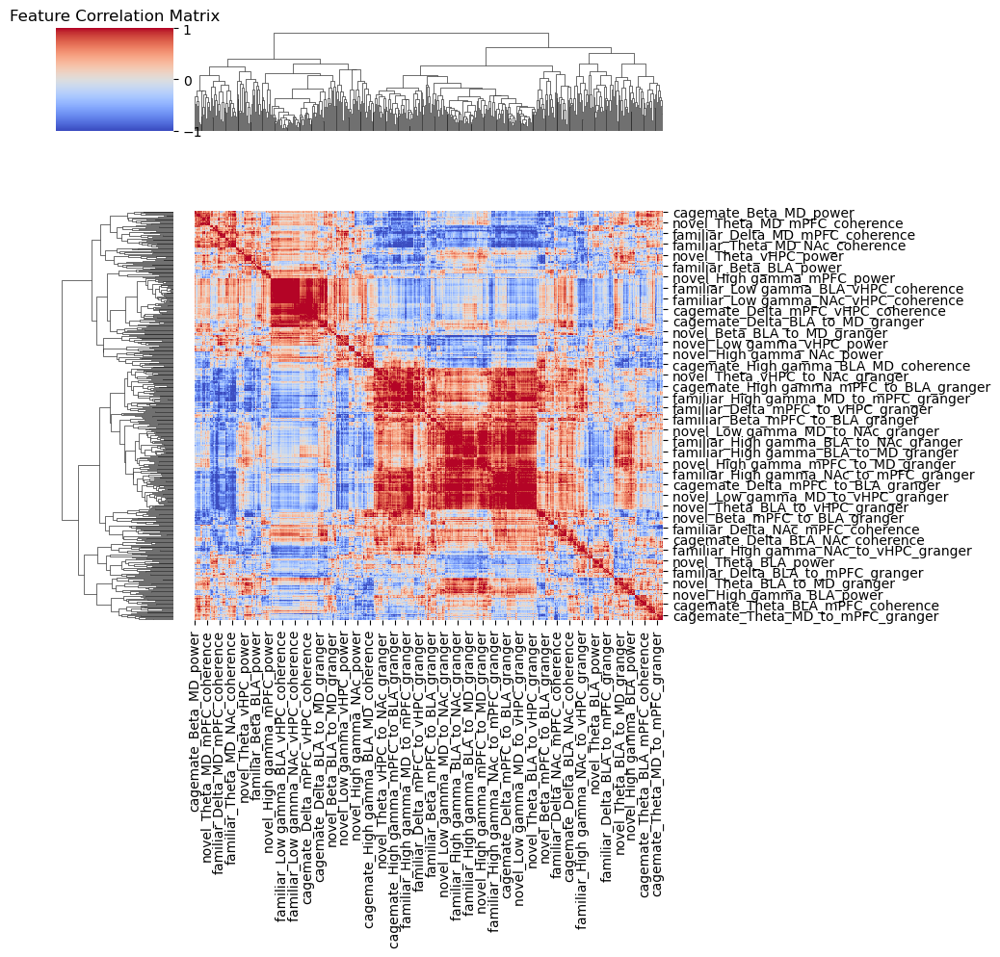

In [43]:
plt.figure(figsize=(40, 40))
corr = sns.clustermap(corr_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Feature Correlation Matrix')
plt.tight_layout()

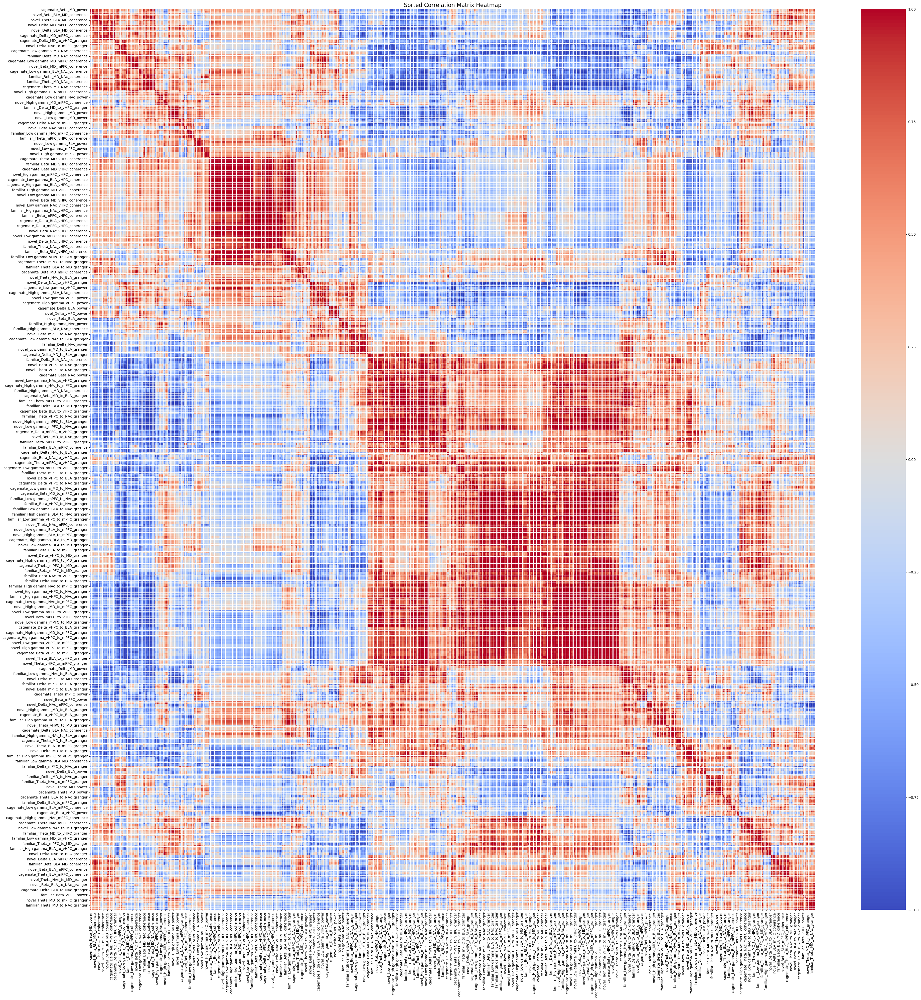

In [44]:
row_order = corr.dendrogram_row.reordered_ind
col_order = corr.dendrogram_col.reordered_ind

# Get the reordered matrix
sorted_corr = corr_matrix.iloc[row_order, col_order]

# Create a standard heatmap with the sorted matrix
plt.figure(figsize=(40, 40))
sns.heatmap(
    sorted_corr,
    cmap='coolwarm',
    annot=False,
    fmt='.2f',
    vmin=-1,
    vmax=1,
    linewidths=0.5
)
plt.title('Sorted Correlation Matrix Heatmap', fontsize=16)
plt.tight_layout()

In [45]:
def identify_feature_groups(corr_matrix, threshold=0.8):
    # Create a copy to avoid modifying the original
    corr_copy = corr_matrix.abs().copy()
    
    # Set diagonal to 0 to avoid self-correlations
    np.fill_diagonal(corr_copy.values, 0)
    
    # Find groups of correlated features
    groups = []
    remaining_features = set(corr_copy.columns)
    
    while remaining_features:
        # Pick a feature
        current_feature = list(remaining_features)[0]
        
        # Find all features correlated with it
        correlated = set(corr_copy.columns[corr_copy[current_feature] > threshold].tolist())
        correlated.add(current_feature)  # Add the feature itself
        
        # If we found a group with at least 2 features
        if len(correlated) > 1:
            groups.append(sorted(correlated))  # Sort for consistent output
            
            # Remove all these features from the remaining set
            remaining_features -= correlated
        else:
            # No correlations found, move to next feature
            remaining_features.remove(current_feature)
    
    return groups

# Identify groups of correlated features
correlated_groups = identify_feature_groups(corr_matrix, threshold=0.8)

  

# Feature selection strategy based on groups
def select_features_from_groups(df, corr_matrix, correlated_groups):
    # Initialize with all features
    selected_features = set(df.columns)
    
    for group in correlated_groups:
        # For demonstration, keep the first feature in each group
        # In practice, you might want to keep the one with highest variance
        # or highest correlation with target
        features_to_remove = group[1:]
        selected_features -= set(features_to_remove)
    
    return list(selected_features)

# Select features
selected_features = select_features_from_groups(lfp_df, corr_matrix, correlated_groups)


In [46]:
from sklearn.feature_selection import mutual_info_regression, SelectKBest
event_iwant = ['cagemate','familiar','novel','empty']
event_info = {}
sniff_itis = []
j = 0
total_sniffs = 0
subject_info = {}

for recording in cups_collection.lfp_recordings:
    subject = recording.subject
    for event, events in recording.behavior_dict.items():
        if event in event_iwant:
            no_events = events.shape[0]
            sniff_length = 0
            for i in range(len(events)):
                sniff_length_temp = events[i][1] - events[i][0]
                sniff_length = sniff_length + sniff_length_temp
                total_sniffs = total_sniffs + 1
                try:
                    sniff_iti = events[i+1][0] - events[i][1]
                    sniff_itis.append(sniff_iti)
                except IndexError:
                    pass
            total_sniff_time = sniff_length/1000
            try:
                avg_event = sniff_length/no_events/1000
            except ZeroDivisionError:
                avg_event = 0
            if subject in event_info.keys():
                dict_event = event_info[subject]
                dict_event[event] =  {'no_events': no_events, 'avg event': avg_event, 'total time': total_sniff_time}
                event_info[subject] =  dict_event
            else:
                event_info[subject] = {event: {'no_events': no_events, 'avg event': avg_event,'total time': total_sniff_time }}
            j += 1
        else:
            pass



    

In [47]:
event_overview = pd.concat({k: pd.DataFrame(v) for k, v in event_info.items()}, axis=0)
event_overview = event_overview.reset_index()

event_overview

,level_0,level_1,familiar,novel,cagemate,empty
0,2.4,no_events,21.000000,57.000000,24.000000,4.000000
1,2.4,avg event,1.746095,2.716947,1.513958,1.316500
2,2.4,total time,36.668000,154.866000,36.335000,5.266000
3,2.3,no_events,29.000000,19.000000,31.000000,29.000000
4,2.3,avg event,4.510241,7.378947,3.941645,3.324034
5,2.3,total time,130.797000,140.200000,122.191000,96.397000
6,2.1,no_events,9.000000,18.000000,49.000000,13.000000
7,2.1,avg event,1.814444,3.103722,7.212000,5.328154
8,2.1,total time,16.330000,55.867000,353.388000,69.266000
9,3.1,no_events,24.000000,59.000000,8.000000,8.000000


In [48]:
event_total_time = event_overview[event_overview['level_1'] == 'total time']
event_total_time['total cup time'] = event_total_time['familiar'] + event_total_time['novel'] + event_total_time['cagemate'] + event_total_time['empty']
event_total_time['cagemate preference']= event_total_time['cagemate'] / event_total_time['total cup time']
event_total_time['familiar preference'] =event_total_time['familiar'] / event_total_time['total cup time']
event_total_time['novel preference'] =event_total_time['novel'] / event_total_time['total cup time']
event_total_time['empty prefernce']= event_total_time['empty'] / event_total_time['total cup time']
event_total_time.index = event_total_time['level_0']
event_total_time = event_total_time.drop(['level_0', 'level_1'], axis = 1)
event_total_time

/scratch/local/65741798/ipykernel_3481685/1272805659.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  event_total_time['total cup time'] = event_total_time['familiar'] + event_total_time['novel'] + event_total_time['cagemate'] + event_total_time['empty']
/scratch/local/65741798/ipykernel_3481685/1272805659.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  event_total_time['cagemate preference']= event_total_time['cagemate'] / event_total_time['total cup time']
/scratch/local/65741798/ipykernel_3481685/

,familiar,novel,cagemate,empty,total cup time,cagemate preference,familiar preference,novel preference,empty prefernce
level_0,,,,,,,,,
2.4,36.668,154.866,36.335,5.266,233.135,0.155854,0.157282,0.664276,0.022588
2.3,130.797,140.200,122.191,96.397,489.585,0.249581,0.267159,0.286365,0.196895
2.1,16.330,55.867,353.388,69.266,494.851,0.714130,0.033000,0.112897,0.139973
3.1,77.932,188.134,28.734,24.599,319.399,0.089963,0.243996,0.589025,0.077017
1.1,7.400,120.868,102.267,42.865,273.400,0.374056,0.027067,0.442092,0.156785
1.3,25.265,61.466,105.463,98.132,290.326,0.363257,0.087023,0.211714,0.338006
4.4,6.665,19.332,512.987,6.332,545.316,0.940715,0.012222,0.035451,0.011612
2.2,15.134,35.533,447.237,26.999,524.903,0.852037,0.028832,0.067694,0.051436
3.2,9.665,71.333,87.866,1.066,169.930,0.517072,0.056876,0.419779,0.006273


In [49]:
lfp_df

,cagemate_Delta_BLA_power,cagemate_Delta_MD_power,cagemate_Delta_NAc_power,cagemate_Delta_mPFC_power,cagemate_Delta_vHPC_power,cagemate_Theta_BLA_power,cagemate_Theta_MD_power,cagemate_Theta_NAc_power,cagemate_Theta_mPFC_power,cagemate_Theta_vHPC_power,...,familiar_High gamma_NAc_to_mPFC_granger,familiar_High gamma_NAc_to_vHPC_granger,familiar_High gamma_mPFC_to_BLA_granger,familiar_High gamma_mPFC_to_MD_granger,familiar_High gamma_mPFC_to_NAc_granger,familiar_High gamma_mPFC_to_vHPC_granger,familiar_High gamma_vHPC_to_BLA_granger,familiar_High gamma_vHPC_to_MD_granger,familiar_High gamma_vHPC_to_NAc_granger,familiar_High gamma_vHPC_to_mPFC_granger
2.4,0.010906,NaN,0.011263,0.010101,0.011782,0.016398,NaN,0.022529,0.027317,0.026563,...,NaN,NaN,NaN,NaN,NaN,NaN,0.384427,0.396168,0.418768,0.435242
2.3,0.007695,0.007136,0.011428,NaN,0.012777,0.025303,0.039911,0.028966,NaN,0.026032,...,0.269310,0.287247,NaN,NaN,NaN,NaN,0.365856,0.327776,0.341308,0.344672
2.1,0.021516,0.017877,0.025508,0.023330,0.026378,0.024113,0.030128,0.029092,0.026742,0.027647,...,0.250030,0.273683,0.267607,0.273639,0.277456,0.283988,0.360411,0.307177,0.343501,0.326420
3.1,0.008248,0.014501,0.011948,0.009718,0.011144,0.024530,0.030770,0.031748,0.036201,0.028556,...,0.270333,0.291375,0.286123,0.266046,0.293362,0.297776,0.330224,0.294882,0.289650,0.331468
1.1,0.014718,0.025366,0.019814,0.015393,0.012497,0.018946,0.034026,0.025430,0.037562,0.027224,...,0.308438,0.323750,0.325271,0.456482,0.335842,0.310985,0.548573,0.561677,0.639625,0.539853
1.3,0.012708,0.017526,0.021438,0.020802,0.014512,0.014792,0.026238,0.022887,0.027458,0.025732,...,0.295863,0.269452,0.245624,0.261421,0.293780,0.285870,0.356119,0.332796,0.347118,0.350499
4.4,0.012058,0.010722,NaN,0.017669,0.012034,0.023470,0.028869,NaN,0.022200,0.030532,...,NaN,NaN,NaN,NaN,NaN,NaN,0.394071,0.306781,0.309898,0.303829
2.2,0.020348,0.020232,0.023883,0.020751,NaN,0.017212,0.024301,0.022001,0.025256,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3.2,0.008950,0.013137,0.013388,0.010970,0.013378,0.015237,0.023670,0.021280,0.030921,0.033060,...,0.324967,0.269526,0.325032,0.459136,0.368364,0.286854,0.530683,0.552222,0.594758,0.669222
4.1,0.011473,0.011364,0.017400,0.020583,0.017865,0.017574,0.026019,0.024682,0.030504,0.027943,...,0.260544,0.255517,0.297333,0.331216,0.305989,0.279666,0.654720,0.288581,0.383815,0.243036


In [17]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import mutual_info_regression
import matplotlib.pyplot as plt

# Assume X contains your 500+ neural features and y is behavioral outcome
# X shape: (n_samples, n_features)
# y shape: (n_samples,)
X = lfp_df 
y = event_total_time['cagemate preference']

# Calculate mutual information between each feature and target
mi_scores = mutual_info_regression(X, y)

# Create DataFrame for better analysis
mi_df = pd.DataFrame({'Feature': X.columns, 
                      'MI_Score': mi_scores})
mi_df = mi_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

# Visualize MI scores
plt.figure(figsize=(12, 6))
plt.bar(mi_df['Feature'][:50], mi_df['MI_Score'][:50])  # Top 50 features
plt.xlabel('Feature Index (sorted by MI)')
plt.xticks(rotation = 90)
plt.ylabel('Mutual Information Score')
plt.title('Top 50 Features by Mutual Information')
plt.tight_layout()

# Feature grouping by brain region
# Assuming you have region labels for each feature
# region_labels = ['region1', 'region2', ...]  # Your region labels for each feature

# # Add region information
# mi_df['Region'] = [region_labels[i] for i in mi_df['Feature']]

# # Get top features per region
# top_per_region = (mi_df.groupby('Region')
#                      .apply(lambda x: x.nlargest(3, 'MI_Score'))
#                      .reset_index(drop=True))

# print("Top 3 features per brain region:")
# print(top_per_region)

# Select top k features based on MI scores
# def select_top_mi_features(X, y, k=50):
#     mi_scores = mutual_info_regression(X, y)
#     top_indices = np.argsort(mi_scores)[-k:]  # Get indices of top k features
#     return X[:, top_indices], top_indices

#X_selected, selected_indices = select_top_mi_features(X, y, k=50)
mi_df[:50]

ValueError: Input X contains NaN.

In [ ]:
y = event_total_time['novel preference']

# Calculate mutual information between each feature and target
mi_scores = mutual_info_regression(X, y)

# Create DataFrame for better analysis
mi_df = pd.DataFrame({'Feature': X.columns, 
                      'MI_Score': mi_scores})
mi_df = mi_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

# Visualize MI scores
plt.figure(figsize=(12, 6))
plt.bar(mi_df['Feature'][:50], mi_df['MI_Score'][:50])  # Top 50 features
plt.xlabel('Feature Index (sorted by MI)')
plt.xticks(rotation = 90)
plt.ylabel('Mutual Information Score')
plt.title('Top 50 Features by Mutual Information')
plt.tight_layout()

# Feature grouping by brain region
# Assuming you have region labels for each feature
# region_labels = ['region1', 'region2', ...]  # Your region labels for each feature

# # Add region information
# mi_df['Region'] = [region_labels[i] for i in mi_df['Feature']]

# # Get top features per region
# top_per_region = (mi_df.groupby('Region')
#                      .apply(lambda x: x.nlargest(3, 'MI_Score'))
#                      .reset_index(drop=True))

# print("Top 3 features per brain region:")
# print(top_per_region)

# Select top k features based on MI scores
# def select_top_mi_features(X, y, k=50):
#     mi_scores = mutual_info_regression(X, y)
#     top_indices = np.argsort(mi_scores)[-k:]  # Get indices of top k features
#     return X[:, top_indices], top_indices

#X_selected, selected_indices = select_top_mi_features(X, y, k=50)
mi_df[:50]

In [ ]:
y = event_total_time['familiar preference']

# Calculate mutual information between each feature and target
mi_scores = mutual_info_regression(X, y)

# Create DataFrame for better analysis
mi_df = pd.DataFrame({'Feature': X.columns, 
                      'MI_Score': mi_scores})
mi_df = mi_df.sort_values('MI_Score', ascending=False).reset_index(drop=True)

# Visualize MI scores
plt.figure(figsize=(12, 6))
plt.bar(mi_df['Feature'][:50], mi_df['MI_Score'][:50])  # Top 50 features
plt.xlabel('Feature Index (sorted by MI)')
plt.xticks(rotation = 90)
plt.ylabel('Mutual Information Score')
plt.title('Top 50 Features by Mutual Information')
plt.tight_layout()

# Feature grouping by brain region
# Assuming you have region labels for each feature
# region_labels = ['region1', 'region2', ...]  # Your region labels for each feature

# # Add region information
# mi_df['Region'] = [region_labels[i] for i in mi_df['Feature']]

# # Get top features per region
# top_per_region = (mi_df.groupby('Region')
#                      .apply(lambda x: x.nlargest(3, 'MI_Score'))
#                      .reset_index(drop=True))

# print("Top 3 features per brain region:")
# print(top_per_region)

# Select top k features based on MI scores
# def select_top_mi_features(X, y, k=50):
#     mi_scores = mutual_info_regression(X, y)
#     top_indices = np.argsort(mi_scores)[-k:]  # Get indices of top k features
#     return X[:, top_indices], top_indices

#X_selected, selected_indices = select_top_mi_features(X, y, k=50)
mi_df[:50]

In [11]:
from importlib import reload
import itertools
reload(lfpa)
regions_bidict = cups_collection.brain_region_dict
averages = {}
events = ['cagemate','novel', 'familiar']
baselines = ['cagemate_baseline', 'novel_baseline', 'familiar_baseline']
          
for recording in cups_collection.lfp_recordings: 
    averages[recording.subject] ={}
    for mode in ['power', 'coherence', 'granger']:
        regions = list(regions_bidict.keys())
        event_avg_dict = lfpa.average_events(recording, events = events, baseline = baselines, mode = mode)
        for event in event_avg_dict.keys():
            if mode == 'power':
                for i in range(len(power_ranges)):
                    for j in range(len(power_ranges[i])):
                        freq_range = power_ranges[i][j]
                        region = regions_bidict.inverse[i]
                        event_array = np.array(event_avg_dict[event])
                        values = event_array[:,freq_range[0]:freq_range[1],i]
                        average_val = np.nanmean(values, axis = 0)
                        averages[recording.subject][f"{event}_{freq_range[0]}_{freq_range[1]}_{region}_power"] = np.nanmean(values)
            # For coherence (2D symmetric matrix) - use combinations
            elif mode == 'coherence':
                # itertools.combinations gives all unique pairs (no repetition, order doesn't matter)
                for i in range(len(coherence_ranges)):
                    for j in range(len(coherence_ranges[i])):
                        for k in range(len(coherence_ranges[i][j])):
                            freq_range = coherence_ranges[i][j][k]
                            region1 = regions_bidict.inverse[i]
                            region2 = regions_bidict.inverse[j]
                            event_array = np.array(event_avg_dict[event])
                            values = event_array[:,freq_range[0]:freq_range[1],i,j]
                            average_val = np.nanmean(values, axis = 0)
                            averages[recording.subject][f"{event}_{freq_range[0]}_{freq_range[1]}_{region1}_{region2}_coherence"] = np.nanmean(values)

#             # For Granger (2D directed matrix) - use permutations
            elif mode == 'granger':
                # itertools.permutations gives all ordered pairs (direction matters)
               for i in range(len(granger_ranges)):
                    for j in range(len(granger_ranges[i])):
                        for k in range(len(granger_ranges[i][j])):
                            freq_range = granger_ranges[i][j][k]
                            region1 = regions_bidict.inverse[i]
                            region2 = regions_bidict.inverse[j]
                            event_array = np.array(event_avg_dict[event])
                            values = event_array[:,freq_range[0]:freq_range[1],i,j]
                            average_val = np.nanmean(values, axis = 0)
                            averages[recording.subject][f"{event}_{freq_range[0]}_{freq_range[1]}_{region1}_to_{region2}_granger"] = np.nanmean(values)


/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:128: RuntimeWarning: Mean of empty slice
  event_snippet = np.nanmean(event_snippet, axis=0)
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/LFP_analysis.py:380: RuntimeWarning: Mean of empty slice
  baseline_recording = np.nanmean(np.array(baseline_averages), axis=0)
/scratch/local/64062145/ipykernel_2665072/1262827870.py:50: RuntimeWarning: Mean of empty slice
  averages[recording.subject][f"{event}_{freq_range[0]}_{freq_range[1]}_{region1}_to_{region2}_granger"] = np.nanmean(values)


In [12]:
lfp_df = pd.DataFrame.from_dict(averages, orient = 'index')
lfp_df

,cagemate_10_16_mPFC_power,cagemate_19_23_mPFC_power,cagemate_43_100_mPFC_power,cagemate_54_85_mPFC_power,cagemate_38_119_mPFC_power,cagemate_5_11_mPFC_power,cagemate_10_14_NAc_power,cagemate_28_40_NAc_power,cagemate_88_97_NAc_power,cagemate_102_114_NAc_power,...,familiar_102_106_BLA_to_NAc_granger,familiar_12_15_BLA_to_MD_granger,familiar_33_35_BLA_to_MD_granger,familiar_57_59_BLA_to_MD_granger,familiar_101_103_BLA_to_MD_granger,familiar_5_11_BLA_to_MD_granger,familiar_29_32_BLA_to_MD_granger,familiar_80_82_BLA_to_MD_granger,familiar_39_44_vHPC_to_MD_granger,familiar_84_86_vHPC_to_MD_granger
2.4,37.925395,8.991804,15.552170,14.815628,14.979706,2.655591,9.801750,-46.590758,-45.023657,-34.332727,...,-21.553244,22.509497,-28.033774,-16.097748,9.998230,-3.265917,-30.540731,27.677493,-6.351581,9.465551
2.3,17.736895,6.858863,8.353146,11.760271,8.314637,6.231423,-3.614795,7.189285,29.574551,10.605847,...,-5.245071,-22.534996,-0.365425,-20.525234,-9.709946,-19.688251,4.336132,13.730771,-28.050863,-4.026844
2.1,55.295405,32.310354,16.954493,16.768089,18.377784,31.762173,102.079029,52.323876,53.854437,46.112217,...,5.587280,2.365989,-7.547162,1.868210,-4.862991,-18.432583,-8.928093,6.961185,0.587759,-14.160395
3.1,55.986967,4.771487,15.421718,12.098450,13.617454,37.182779,29.149385,21.885202,6.912652,2.840106,...,3.443794,0.023356,8.474127,19.220130,13.227517,-16.599253,18.993398,4.881734,2.279908,31.649377
1.1,46.154521,10.401230,30.096325,31.437744,32.603392,108.452931,38.980489,17.431227,45.904912,63.937380,...,-21.666993,35.856602,-43.667909,-10.643151,-60.331428,-3.725979,-56.134397,-9.131279,-36.627890,17.949778
1.3,17.128365,-3.177682,9.033120,11.451418,7.824015,18.807941,21.545801,6.850450,47.632188,25.901813,...,-2.477706,2.426807,12.850105,-13.008726,2.304606,7.768052,1.058825,48.747768,-25.425104,-19.966957
4.4,38.347225,11.778819,30.033161,32.868774,32.945511,-14.859517,50.965562,24.563832,66.221338,72.791369,...,-6.485872,19.601202,-17.963322,-53.971114,-20.315197,-7.082140,23.854715,-27.050957,5.006670,-20.457152
2.2,18.340335,9.072224,13.543412,12.136847,13.360066,37.465194,20.243175,31.326581,16.694397,13.177379,...,72.509712,-16.050901,7.745747,-4.831761,105.152863,49.686662,-46.018908,66.257947,-42.031211,15.240274
3.2,-11.792099,-28.211090,20.376266,15.303702,24.672463,14.838055,11.357617,-15.235673,51.093552,61.662133,...,-45.716854,63.672038,133.867220,-51.410196,12.148307,50.311189,13.782436,-11.070998,-21.640856,59.555370
4.1,38.459303,-0.508170,27.498261,25.006820,25.463303,8.469014,-12.334524,5.301011,27.351307,34.086776,...,4.469842,8.608180,-0.297380,8.223104,-7.809339,-4.121441,-8.227131,6.822368,3.295029,-16.144093


[[], [], [], [], [[np.int64(52), np.int64(56)], [np.int64(89), np.int64(93)]]]